In [2]:
#importing all the needed libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from copy import deepcopy

In [3]:
#scaling, normalization
from sklearn.preprocessing import StandardScaler, MinMaxScaler

#kmeans, dbscan, hierarchical (sklearn)
from sklearn.cluster import KMeans
#evaluation
from sklearn.metrics import silhouette_score, pairwise_distances_argmin_min

from scipy.stats import median_abs_deviation

#distance matrix (dbscan elbow, hierarchical)
from scipy.spatial.distance import pdist, squareform, cdist

# hierarchical (scipy)
from scipy.cluster.hierarchy import linkage, dendrogram, fcluster

# --- DBSCAN (with distance-based eps tuning) ---
from sklearn.neighbors import NearestNeighbors

import random


## 0. Preprocessing

In [4]:
df = pd.read_csv("./dataset/DM1_game_dataset_cleaned.csv")

df.columns

Index(['Name', 'YearPublished', 'GameWeight', 'MinPlayers', 'MaxPlayers',
       'MfgPlaytime', 'MfgAgeRec', 'NumAlternates', 'NumExpansions',
       'NumImplementations', 'IsReimplementation', 'Kickstarted', 'Rating',
       'HasFamily', 'Category', 'Rank', 'EngagementLevel'],
      dtype='object')

Excluded columns due to high zero values: ['NumAlternates', 'NumExpansions', 'NumImplementations']
Log-transforming columns: ['YearPublished', 'MinPlayers', 'MaxPlayers', 'MfgPlaytime']


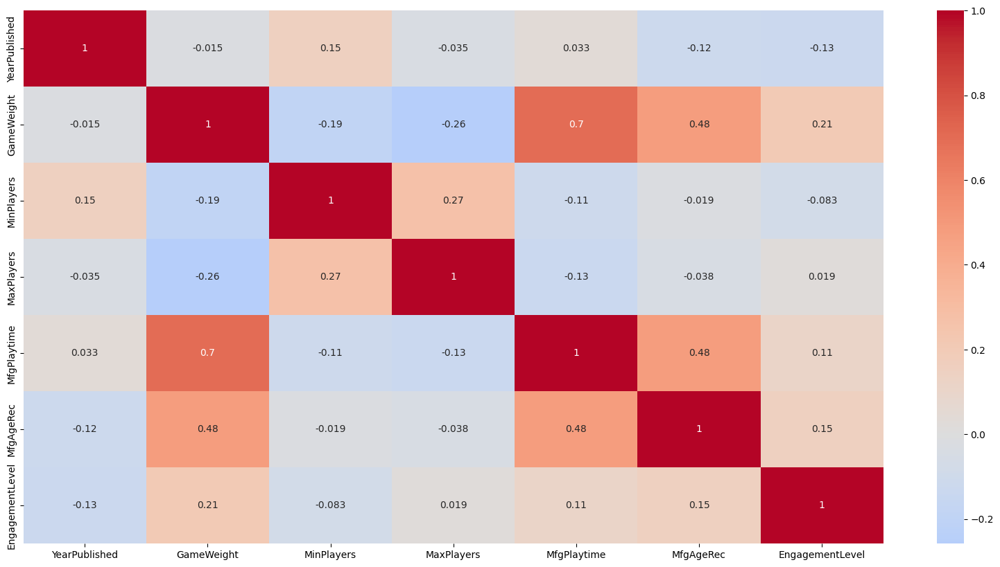

In [5]:
# --- 1. Select numeric columns ---
df_num = df.select_dtypes(include=['float64', 'int64'])

# Remove binaries and Rank columns
numeric_cols = [col for col in df_num.columns if df_num[col].nunique() > 2 and 'Rank' not in col]
df_num = df_num[numeric_cols].copy()

# --- 2. Fix YearPublished (recency) ---
if 'YearPublished' in df_num.columns:
    current_year = df['YearPublished'].max()
    df_num['YearPublished'] = current_year - df_num['YearPublished']



# --- 3. Exclude columns with high zero values ---
zero_threshold = 0.5
cols_to_exclude = [col for col in df_num.columns if (df_num[col] == 0).mean() > zero_threshold]
df_num.drop(columns=cols_to_exclude, inplace=True)
print("Excluded columns due to high zero values:", cols_to_exclude)

# log transform skewed columns except EngagementLevel
skewed_cols = df_num.skew().abs()
log_cols = skewed_cols[((skewed_cols > 1.0) | (skewed_cols < -1.0)) & (skewed_cols.index != 'EngagementLevel')].index.tolist()
df_num[log_cols] = df_num[log_cols].apply(np.log1p)
print("Log-transforming columns:", log_cols)


# --- 4. Standardize BEFORE outlier detection ---
scaler = StandardScaler()
X_scaled = scaler.fit_transform(df_num)


'''# --- 5. Compute robust center (mean in scaled space) ---
center = np.mean(X_scaled, axis=0)

dists = np.linalg.norm(X_scaled - center, axis=1) # euclidean distance from center

threshold = np.percentile(dists, 95.0)  # top 5% as outliers

mask_keep = dists <= threshold

print("Rows removed:", np.sum(~mask_keep))

# Filter dataset
df_filtered = df_num.loc[mask_keep].reset_index(drop=True)
X_filtered = X_scaled[mask_keep]
print(df_filtered.columns)
print("Filtered dataset shape:", df_filtered.shape)
print("Scaled filtered shape:", X_filtered.shape)

# --- 7. FINAL SCALING (Crucial Step) ---
# Scaliamo di nuovo i dati puliti per garantire mean=0, std=1 per il K-Means
X_filtered = scaler.fit_transform(df_filtered)

# --- 8. Correlation Matrix ---
plt.figure(figsize=(20,10))
sns.heatmap(df_filtered.corr(), cmap="coolwarm", center=0, annot=True)
plt.show()'''


plt.figure(figsize=(20,10))
sns.heatmap(df_num.corr(), cmap="coolwarm", center=0, annot=True)
plt.show()


## 1. K-Means

In [79]:
kmeans = KMeans(n_clusters=5, n_init=10, max_iter=100, random_state=94)
kmeans.fit(X_scaled)

,n_clusters,5
,init,'k-means++'
,n_init,10
,max_iter,100
,tol,0.0001
,verbose,0
,random_state,94
,copy_x,True
,algorithm,'lloyd'


In [80]:
# labels
labels = kmeans.labels_
labels

array([4, 1, 3, ..., 4, 3, 4])

In [81]:
# centroids
centroids = kmeans.cluster_centers_
centroids

array([[ 0.49549807,  1.18604382, -0.03834047, -0.56454475,  1.18733874,
         0.59548168, -0.34401989],
       [ 0.17359678, -0.72233336,  0.00453489, -0.06834518, -0.7429864 ,
        -0.90577175, -0.43429006],
       [-0.13954038,  0.27917588,  0.23282211, -0.01884603,  0.10197211,
         0.25035416,  1.43169765],
       [-0.96046206,  0.48077034, -1.58196183, -0.32759703,  0.33326341,
         0.56515246,  0.36006378],
       [-0.05926029, -0.50882881,  0.98913568,  1.04718366, -0.18019076,
         0.50459256, -0.41920732]])

<Figure size 1000x600 with 0 Axes>

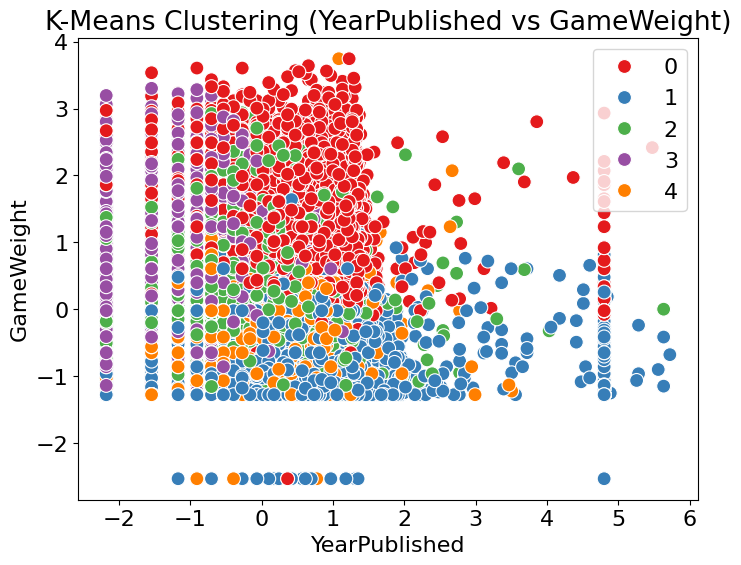

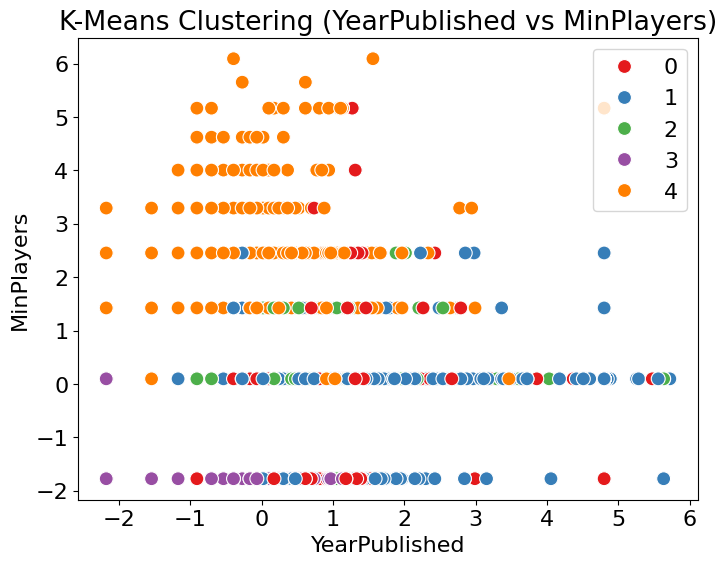

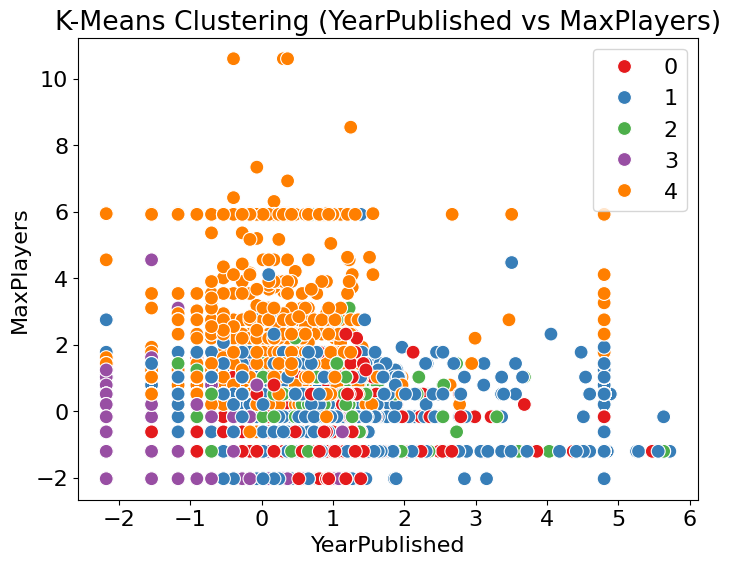

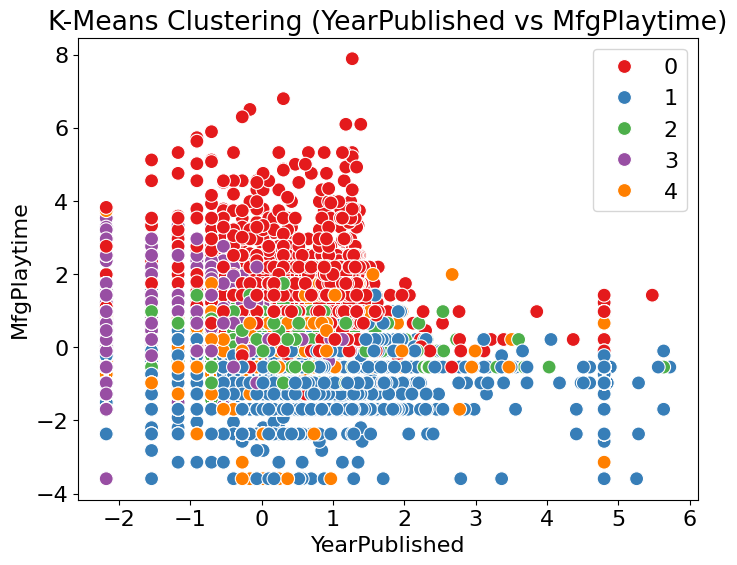

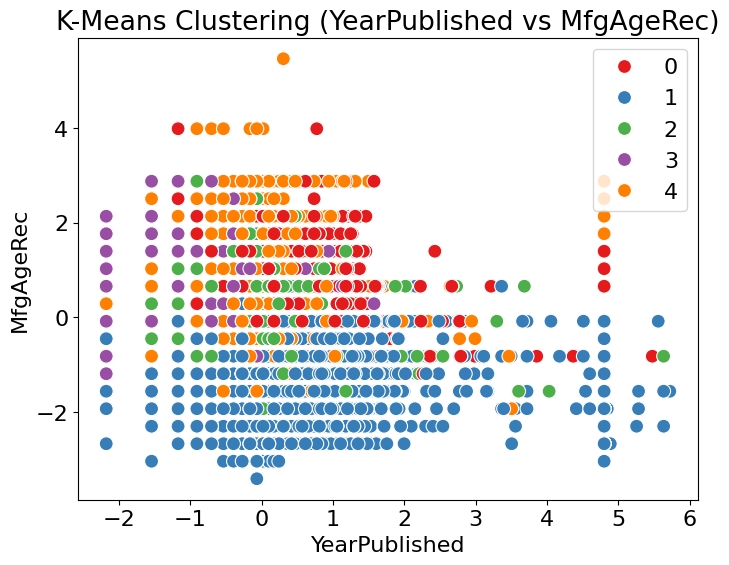

...

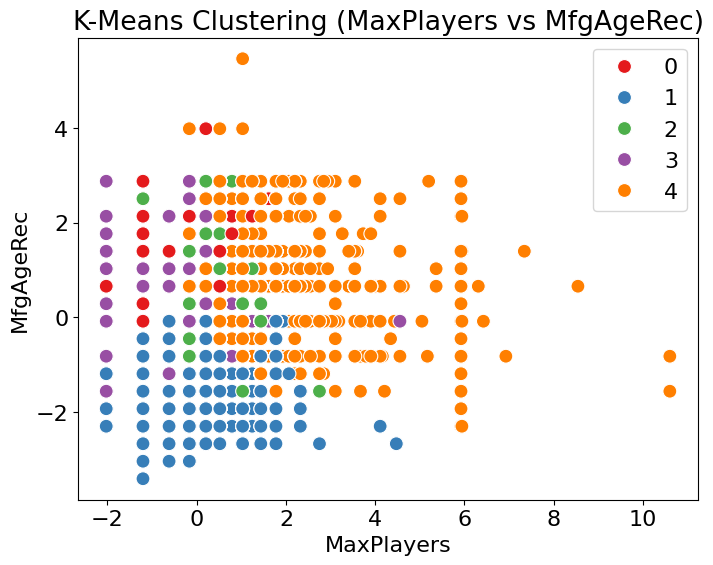

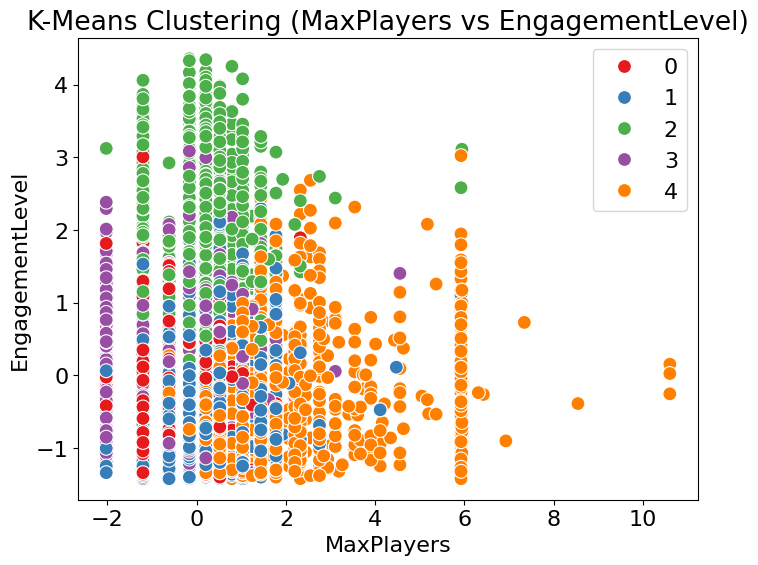

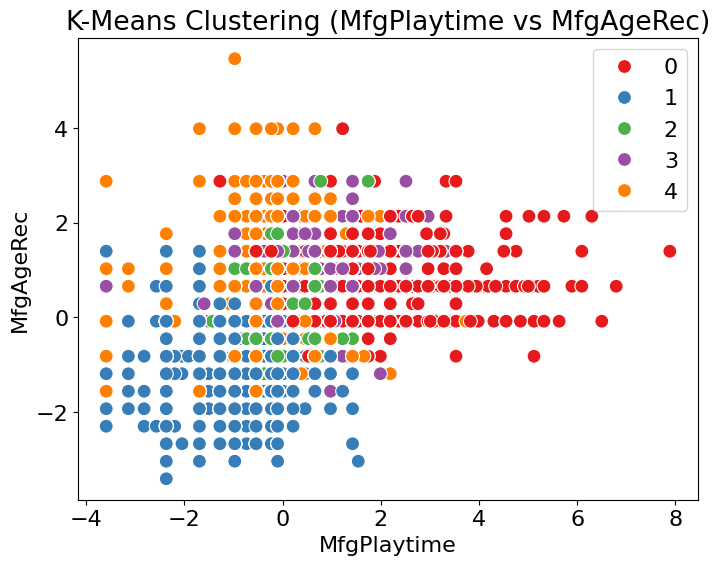

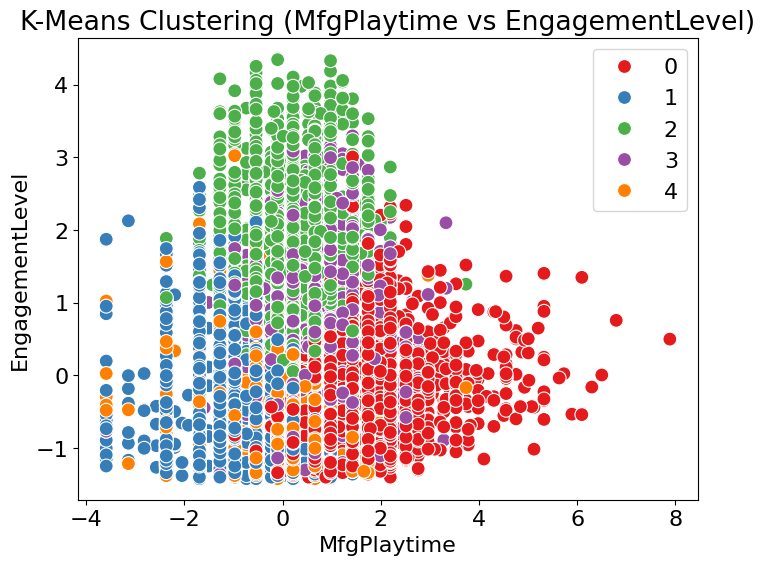

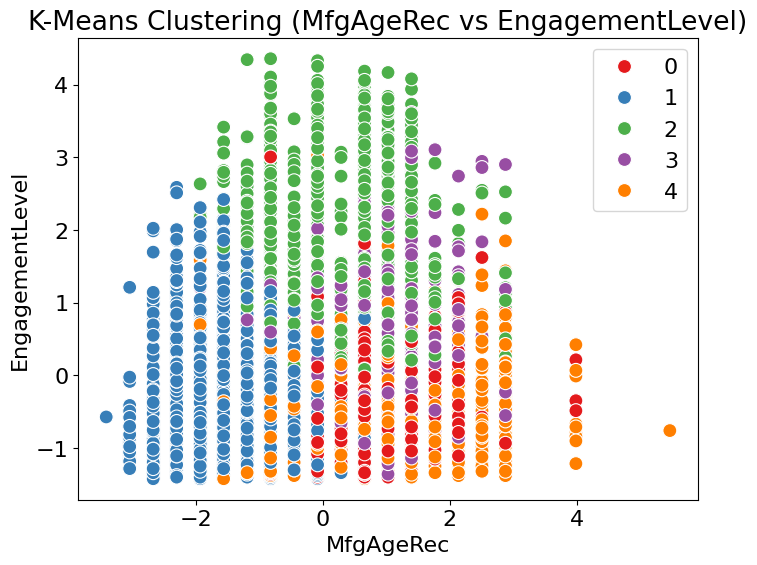

C:\Users\leona\AppData\Local\Temp\ipykernel_22084\3284957880.py:14: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


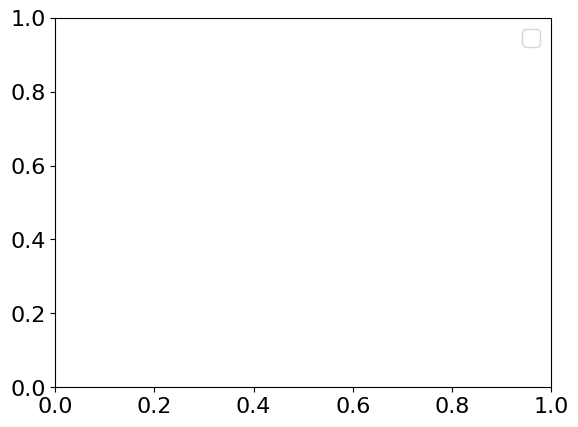

In [105]:
# plotting the clusters for each combination of two features (only first 2 for visualization)
mapping_features = df_num.columns.tolist()
plt.figure(figsize=(10, 6))
for i in range(X_scaled.shape[1]):
    for j in range(i + 1, X_scaled.shape[1]):
        plt.figure(figsize=(8, 6))
        sns.scatterplot(x=X_scaled[:, i], y=X_scaled[:, j], hue=labels, palette='Set1', s=100)
        #plt.scatter(centroids[:, i], centroids[:, j], c='black', s=100, marker='X', label='Centroids')
        plt.title(f'K-Means Clustering ({mapping_features[i]} vs {mapping_features[j]})')
        plt.xlabel(f'{mapping_features[i]}')
        plt.ylabel(f'{mapping_features[j]}')
        plt.legend()
        plt.show()
plt.legend()
plt.show()

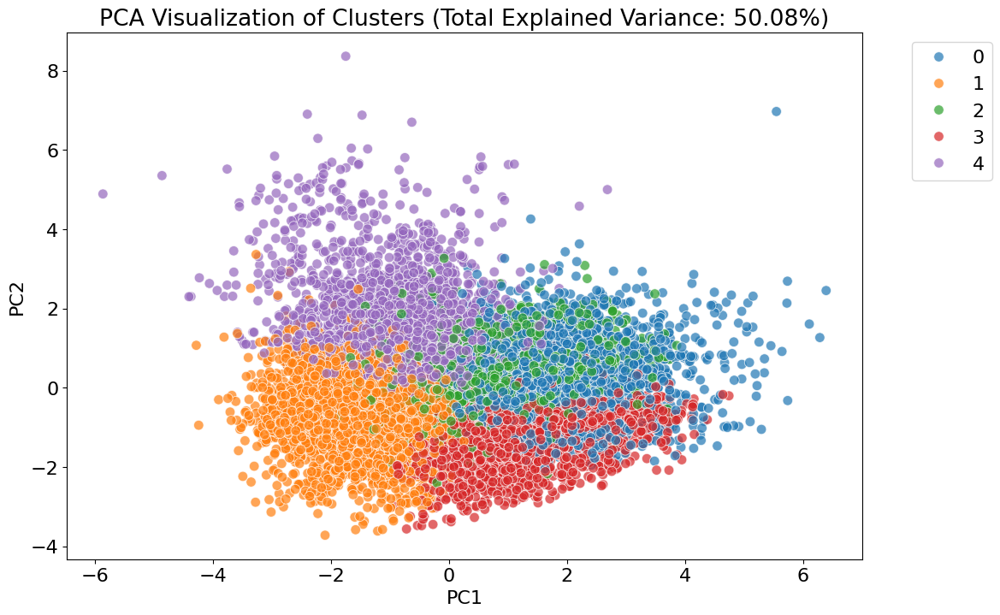

Varianza spiegata dalla PC1: 32.65%
Varianza spiegata dalla PC2: 17.43%


In [82]:
from sklearn.decomposition import PCA

# --- 1. Calcolo della PCA ---
# Riduciamo a 2 componenti per poter fare un grafico 2D
pca = PCA(n_components=2)
principal_components = pca.fit_transform(X_scaled)

# Creiamo un DataFrame per il grafico
df_pca = pd.DataFrame(data=principal_components, columns=['PC1', 'PC2'])
df_pca['Cluster'] = labels  # Le etichette trovate prima col K-Means

# --- 2. Plotting ---
plt.figure(figsize=(12, 8))
sns.scatterplot(
    x='PC1', y='PC2',
    hue='Cluster',
    data=df_pca,
    palette='tab10',
    s=70,           # Grandezza punti
    alpha=0.7,      # Trasparenza per vedere sovrapposizioni
    edgecolor='w'   # Bordo bianco per stacco visivo
)


# Titolo con info sulla varianza spiegata
expl_var = pca.explained_variance_ratio_
plt.title(f'PCA Visualization of Clusters (Total Explained Variance: {sum(expl_var):.2%})')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

print(f"Varianza spiegata dalla PC1: {expl_var[0]:.2%}")
print(f"Varianza spiegata dalla PC2: {expl_var[1]:.2%}")

In [ ]:
# PCA visualization 3d
from mpl_toolkits.mplot3d import Axes3D
pca_3d = PCA(n_components=3)
X_pca_3d = pca_3d.fit_transform(X_scaled)
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(X_pca_3d[:, 0], X_pca_3d[:, 1], X_pca_3d[:, 2], c=labels, cmap='Set1', s=100)
ax.set_title('K-Means Clustering (3D PCA Projection)')
ax.set_xlabel('PCA Component 1')
ax.set_ylabel('PCA Component 2')
ax.set_zlabel('PCA Component 3')

expl_var = pca_3d.explained_variance_ratio_
plt.title(f'PCA Visualization of Clusters (Total Explained Variance: {sum(expl_var):.2%})')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

print(f"Varianza spiegata dalla PC1: {expl_var[0]:.2%}")
print(f"Varianza spiegata dalla PC2: {expl_var[1]:.2%}")
print(f"Varianza spiegata dalla PC3: {expl_var[2]:.2%}")
plt.legend()
plt.show()

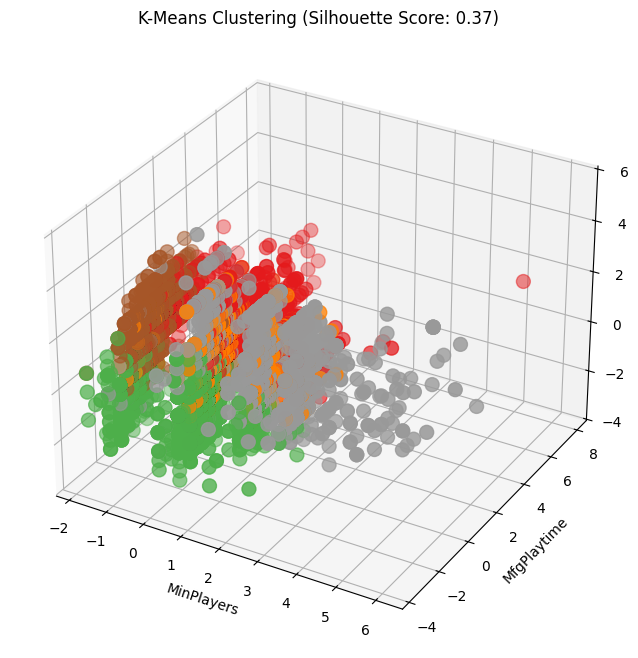

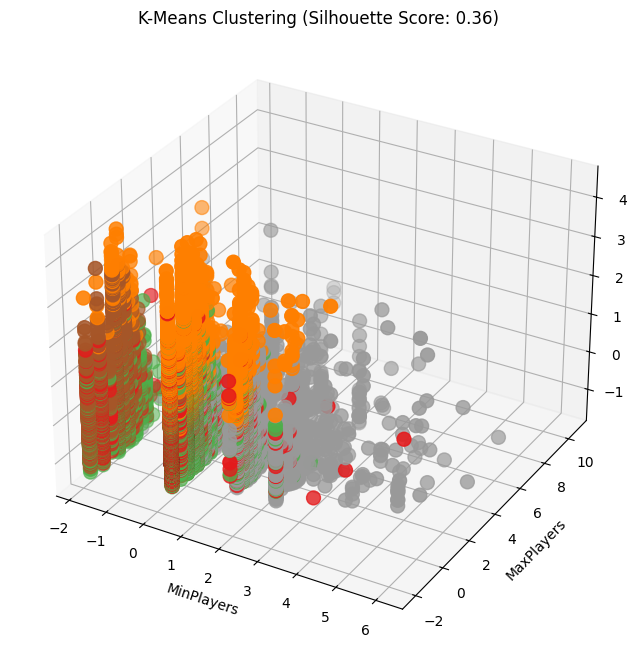

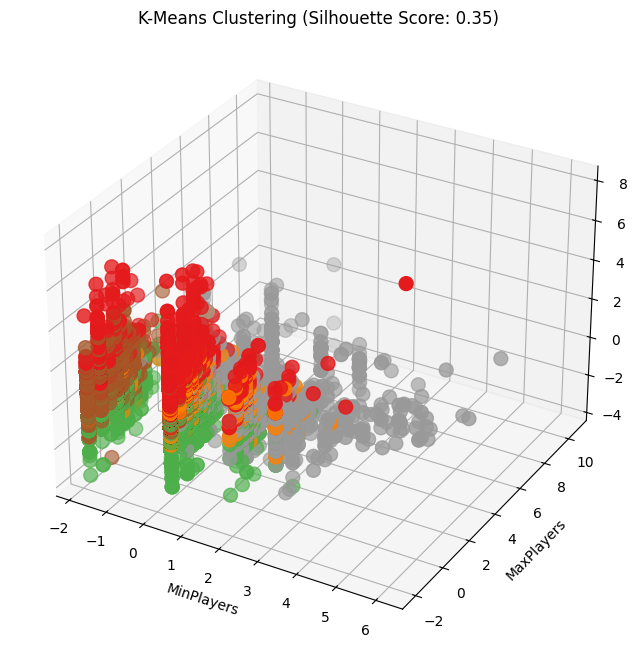

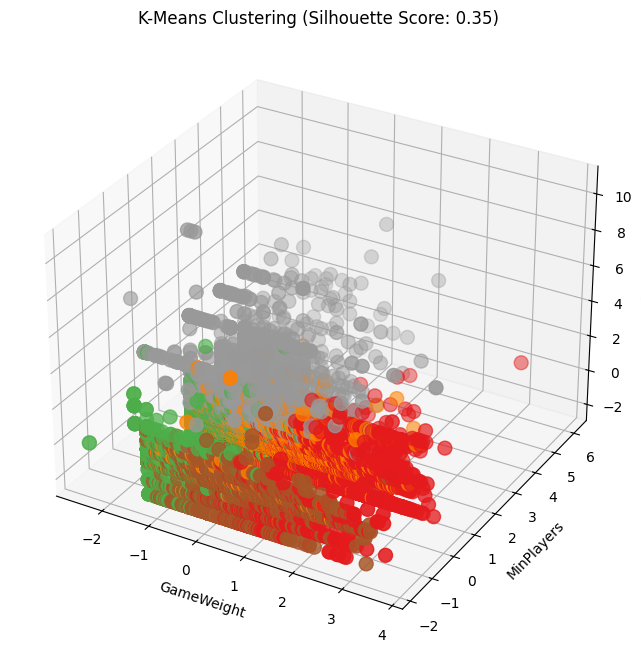

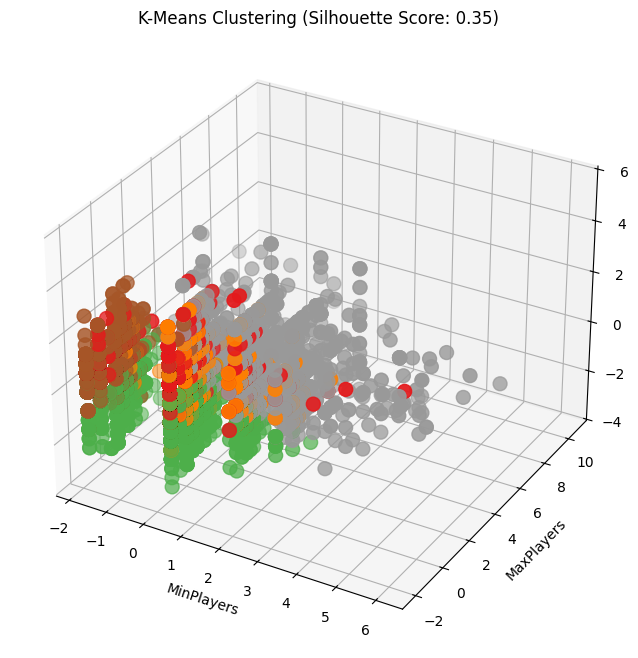

In [48]:
# computing silhouette score for combinations of three features
from itertools import combinations
feature_indices = range(X_scaled.shape[1])
silhouette_scores = {}
mapping_features = df_num.columns.tolist()
for combo in combinations(feature_indices, 3):
    X_subset = X_scaled[:, combo]
    kmeans_subset = KMeans(n_clusters=4, n_init=10, max_iter=100, random_state=94)
    labels_subset = kmeans_subset.fit_predict(X_subset)
    score = silhouette_score(X_subset, labels_subset)
    silhouette_scores[combo] = score
#take the first 5 combinations with highest silhouette score
top_5_combos = sorted(silhouette_scores.items(), key=lambda x: x[1], reverse=True)[:5]
# Plot 3d scatter plots for top 5 combinations
from mpl_toolkits.mplot3d import Axes3D
for combo, score in top_5_combos:
    fig = plt.figure(figsize=(10, 8))
    ax = fig.add_subplot(111, projection='3d')
    ax.scatter(X_scaled[:, combo[0]], X_scaled[:, combo[1]], X_scaled[:, combo[2]], c=labels, cmap='Set1', s=100)
    ax.set_title(f'K-Means Clustering (Silhouette Score: {score:.2f})')
    ax.set_xlabel(f'{mapping_features[combo[0]]}')
    ax.set_ylabel(f'{mapping_features[combo[1]]}')
    ax.set_zlabel(f'{mapping_features[combo[2]]}')
    plt.show()


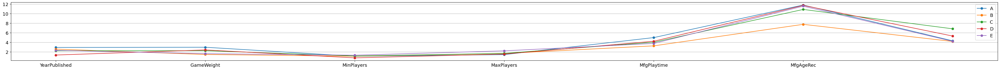

In [42]:
plt.figure(figsize=(50, 3))

centers = scaler.inverse_transform(centroids)

clust_name = ['A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'L', 'M', 'N', 'O', 'P', 'Q', 'R', 'S', 'T', 'U', 'V']

for i in range(len(centers)):
    plt.plot(centers[i], marker='o', label=clust_name[i])

plt.xticks(range(0,len(df_num.columns) - 1), df_num.columns[:-1], fontsize=13)
plt.yticks(fontsize=13)

plt.legend(fontsize=13, loc='best')
plt.grid(axis='y')

In [84]:
# SSE and silhouette score
sse = kmeans.inertia_
print(f'SSE: {sse:.4f}')

sil_score = silhouette_score(X_scaled, labels)
print(f'Silhouette Score: {sil_score:.4f}')

SSE: 90339.7791
Silhouette Score: 0.1802


In [85]:
%%time
sse_list = []

for k in range(2, 51):
    kmeans = KMeans(n_clusters=k, n_init=10, max_iter=100, random_state = 42)
    kmeans.fit(X_scaled)
    sse_list.append(kmeans.inertia_)

CPU times: total: 3min 31s
Wall time: 34.9 s


In [ ]:
%%time
sil_list = []
dist = squareform(pdist(X_scaled)) # using a precomputed distance matrix

for k in range(2, 51):
    kmeans = KMeans(n_clusters=k, n_init=10, max_iter=100, random_state = 42)
    kmeans.fit(X_scaled)
    sil_list.append(silhouette_score(dist, kmeans.labels_, metric='precomputed'))

CPU times: total: 6min 10s
Wall time: 2min 58s


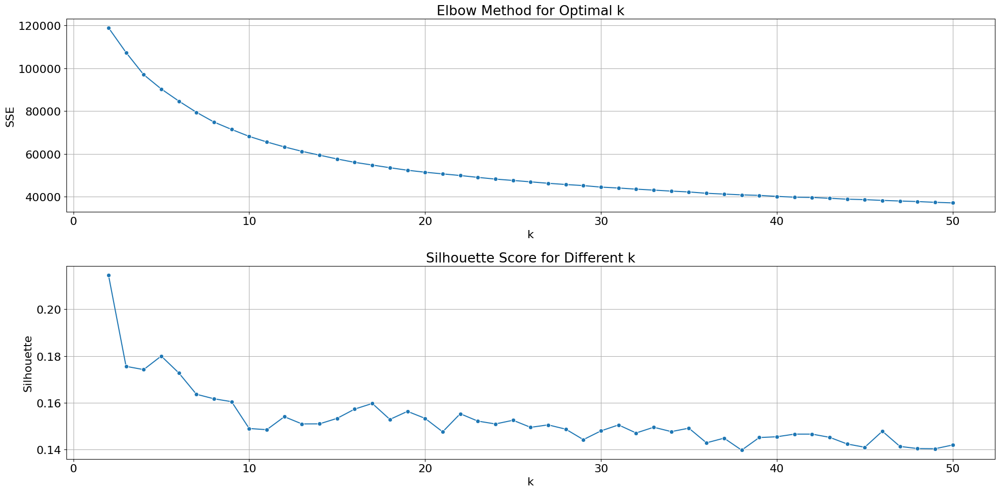

In [104]:
# create 2 subplots with grid and hogher figure size
# fontsize=16  
plt.rcParams['font.size'] =16
fig, axs = plt.subplots(2, figsize=(20, 10))

sns.lineplot(x=range(2,51), y=sse_list, marker='o', ax=axs[0])
axs[0].set(xlabel='k', ylabel='SSE')
axs[0].grid(True)
axs[0].set_title('Elbow Method for Optimal k')


sns.lineplot(x=range(2,51), y=sil_list, marker='o', ax=axs[1])
axs[1].set(xlabel='k', ylabel='Silhouette')
axs[1].grid(True)
axs[1].set_title('Silhouette Score for Different k')


plt.tight_layout() # Adjust the padding between and around subplots
plt.show()

In [212]:
# finding couple of features with high silhouette score
from itertools import combinations
feature_indices = range(X_scaled.shape[1])
best_score = -1
best_pair = None

for pair in combinations(feature_indices, 2):
    X_pair = X_scaled[:, pair]
    kmeans = KMeans(n_clusters=20, n_init=10, max_iter=100, random_state=94)
    kmeans.fit(X_pair)
    score = silhouette_score(X_pair, kmeans.labels_)
    if score > best_score:
        best_score = score
        best_pair = pair
print(f'Best feature pair: {best_pair} with Silhouette Score: {best_score:.4f}')

Best feature pair: (2, 3) with Silhouette Score: 0.8715


## SSE Statistical Evaluation

In [214]:
random.seed(42)
N = 500
sse_stats = []

for _ in range(N):
    Xi = np.zeros(shape=X_scaled.shape)

    for cidx in range(Xi.shape[1]):
        col = X_scaled[:, cidx]
        min, max, nor = np.min(col), np.max(col), len(col)
        Xi[:, cidx] = np.random.uniform(min, max, (1, nor))

    kmeans = KMeans(n_clusters=3, n_init=10, max_iter=100, random_state=94)
    kmeans.fit(Xi)
    sse_stats.append(kmeans.inertia_)

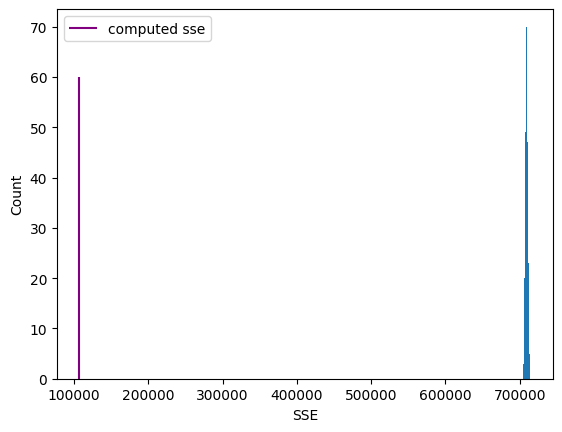

In [215]:
plt.hist(sse_stats, bins='auto')
plt.vlines(x = sse, ymin = 0, ymax = 60, colors = 'purple', label = 'computed sse')
plt.xlabel('SSE')
plt.ylabel('Count')
plt.legend()
plt.show()

## Analyzing clusters

(21879, 7)
21879
Inverting log transformations for readability...

--- Cluster Summary (Mean Values) ---


Cluster,0,1,2,3,4
YearPublished,2002.00,2010.00,2013.00,2018.00,2012.00
GameWeight,2.91,1.36,2.19,2.33,1.58
MinPlayers,2.00,2.00,2.00,1.00,3.00
MaxPlayers,2.00,4.00,4.00,4.00,6.00
MfgPlaytime,120.00,30.00,60.00,60.00,45.00
MfgAgeRec,12.00,8.00,10.00,12.00,12.00
EngagementLevel,4.15,4.00,6.66,5.08,4.05
Count,4196.00,7556.00,3677.00,2767.00,3683.00
% Total,19.18,34.54,16.81,12.65,16.83


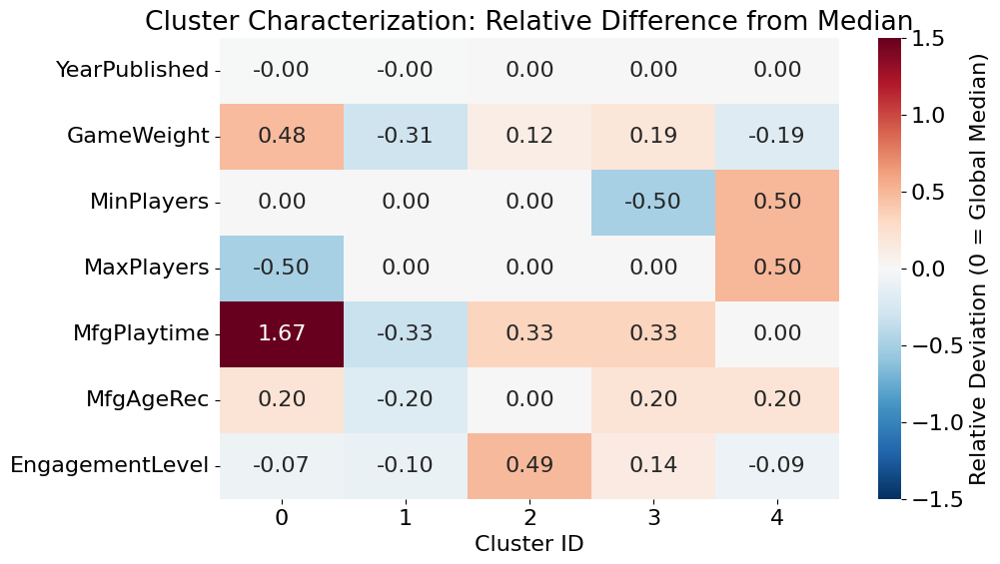

C:\Users\leona\AppData\Local\Temp\ipykernel_22084\2140933352.py:73: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Cluster', y=col, data=df_analysis, ax=axes[i], palette='tab10')
C:\Users\leona\AppData\Local\Temp\ipykernel_22084\2140933352.py:73: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Cluster', y=col, data=df_analysis, ax=axes[i], palette='tab10')
C:\Users\leona\AppData\Local\Temp\ipykernel_22084\2140933352.py:73: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Cluster', y=col, data=df_analysis, ax=axes[i], palette='tab10')
C:\U

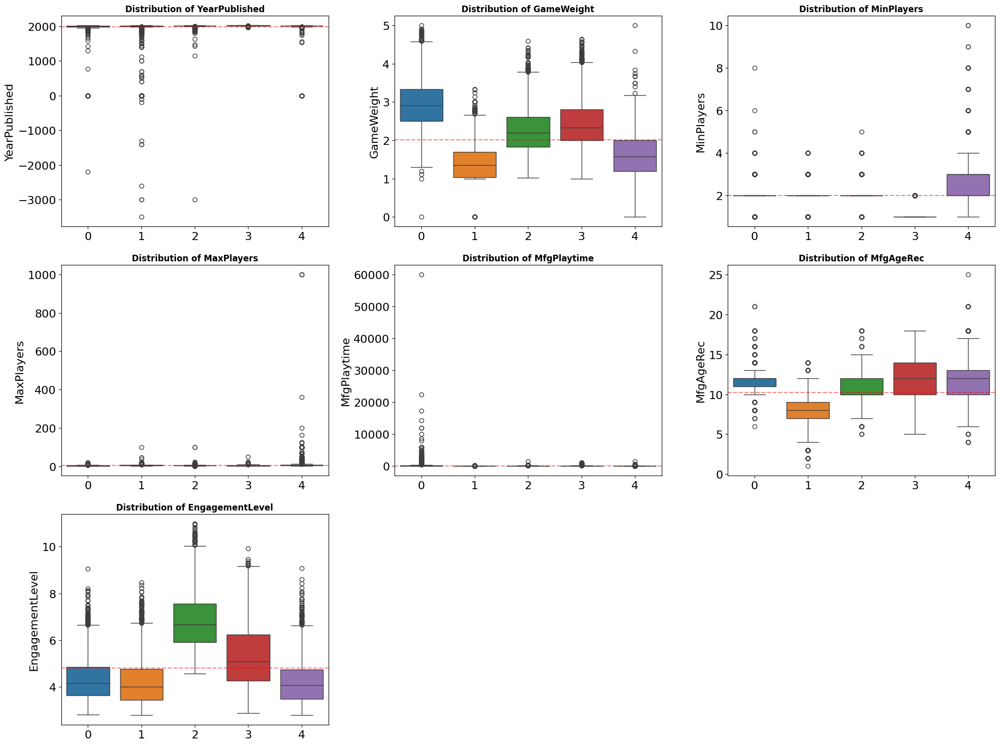


--- Analysis for Cluster 0 ---


,count,mean,std,min,25%,50%,75%,max
YearPublished,4196.0,1975.51,217.85,-2200.0,1987.00,2002.00,2012.00,2021.00
GameWeight,4196.0,2.96,0.63,0.0,2.50,2.91,3.33,5.00
MinPlayers,4196.0,1.95,0.43,1.0,2.00,2.00,2.00,8.00
MaxPlayers,4196.0,3.43,1.87,1.0,2.00,2.00,4.00,20.00
MfgPlaytime,4196.0,269.83,1189.41,15.0,90.00,120.00,240.00,60000.00
MfgAgeRec,4196.0,11.82,1.50,6.0,11.00,12.00,12.00,21.00
EngagementLevel,4196.0,4.30,0.89,2.8,3.62,4.15,4.83,9.06



--- Analysis for Cluster 1 ---


,count,mean,std,min,25%,50%,75%,max
YearPublished,7556.0,1963.45,297.59,-3500.00,2000.00,2010.00,2015.00,2021.00
GameWeight,7556.0,1.44,0.42,0.00,1.03,1.36,1.69,3.33
MinPlayers,7556.0,1.97,0.37,1.00,2.00,2.00,2.00,4.00
MaxPlayers,7556.0,4.56,2.29,1.00,4.00,4.00,6.00,99.00
MfgPlaytime,7556.0,29.22,18.32,1.00,15.00,30.00,35.75,200.00
MfgAgeRec,7556.0,7.77,1.88,1.00,7.00,8.00,9.00,14.00
EngagementLevel,7556.0,4.17,0.92,2.77,3.43,4.00,4.75,8.47



--- Analysis for Cluster 2 ---


,count,mean,std,min,25%,50%,75%,max
YearPublished,3677.0,2007.35,86.13,-3000.00,2006.00,2013.00,2017.00,2021.00
GameWeight,3677.0,2.24,0.60,1.02,1.83,2.19,2.61,4.59
MinPlayers,3677.0,2.11,0.41,1.00,2.00,2.00,2.00,5.00
MaxPlayers,3677.0,4.64,2.74,1.00,4.00,4.00,5.00,100.00
MfgPlaytime,3677.0,63.72,45.12,5.00,40.00,60.00,90.00,1440.00
MfgAgeRec,3677.0,10.89,2.09,5.00,10.00,10.00,12.00,18.00
EngagementLevel,3677.0,6.82,1.20,4.55,5.91,6.66,7.56,10.98



--- Analysis for Cluster 3 ---


,count,mean,std,min,25%,50%,75%,max
YearPublished,2767.0,2016.56,5.74,1962.00,2015.00,2018.00,2020.00,2021.00
GameWeight,2767.0,2.40,0.67,1.00,2.00,2.33,2.81,4.65
MinPlayers,2767.0,1.10,0.31,1.00,1.00,1.00,1.00,2.00
MaxPlayers,2767.0,3.98,2.02,1.00,2.00,4.00,5.00,50.00
MfgPlaytime,2767.0,86.89,84.70,1.00,45.00,60.00,120.00,1200.00
MfgAgeRec,2767.0,11.74,2.09,5.00,10.00,12.00,14.00,18.00
EngagementLevel,2767.0,5.30,1.33,2.86,4.26,5.08,6.23,9.93



--- Analysis for Cluster 4 ---


,count,mean,std,min,25%,50%,75%,max
YearPublished,3683.0,1996.62,152.23,-0.00,2003.00,2012.00,2016.00,2021.00
GameWeight,3683.0,1.61,0.49,0.00,1.20,1.58,2.00,5.00
MinPlayers,3683.0,2.74,0.94,1.00,2.00,3.00,3.00,10.00
MaxPlayers,3683.0,13.14,35.28,2.00,5.00,6.00,8.00,999.00
MfgPlaytime,3683.0,49.94,42.02,1.00,30.00,45.00,60.00,1440.00
MfgAgeRec,3683.0,11.57,2.59,4.00,10.00,12.00,13.00,25.00
EngagementLevel,3683.0,4.20,0.91,2.77,3.48,4.05,4.74,9.09


In [107]:
# --- 1. Preparazione dei Dati per l'Analisi ---
# Copiamo il dataset filtrato per non sporcare l'originale
df_analysis = df_num.copy()
print(df_analysis.shape)
# Aggiungiamo le etichette dei cluster trovati
# Assicurati che 'kmeans' sia il tuo modello fittato e 'X_final' i dati usati
print(len(labels))
df_analysis['Cluster'] = labels

# --- IMPORTANTE: Inversione delle trasformazioni ---
# Per interpretare i dati, dobbiamo tornare ai valori originali (non logaritmici)
# Se hai la lista 'log_cols' dal tuo codice precedente:
if 'log_cols' in locals():
    print("Inverting log transformations for readability...")
    for col in log_cols:
        if col in df_analysis.columns:
            # Applichiamo expm1 (inverso di log1p)
            df_analysis[col] = np.expm1(df_analysis[col])

# ritraformazione di YearPublished in 'Anno' invece di 'Recency'
if 'YearPublished' in df_analysis.columns:
    df_analysis['YearPublished'] = df['YearPublished'].max() - df_analysis['YearPublished']

# --- 2. Tabella Riassuntiva (Centroidi Reali) ---
# Calcoliamo la mediana di ogni feature per ogni cluster
cluster_medians = df_analysis.groupby('Cluster').median()
cluster_counts = df_analysis['Cluster'].value_counts().sort_index()

# Aggiungiamo la dimensione del cluster per contesto
cluster_summary = cluster_medians.copy()
cluster_summary['Count'] = cluster_counts
cluster_summary['% Total'] = (cluster_counts / len(df_analysis)) * 100

print("\n--- Cluster Summary (Mean Values) ---")
# Trasponiamo per leggere meglio se hai tante colonne
display(cluster_summary.T.round(2))


# --- 3. Heatmap delle Differenze Relative (Profilazione) ---
# Questa visualizzazione risponde a: "In cosa questo cluster è diverso dalla mediana globale?"
# Rosso = Molto sopra la mediana, Blu = Molto sotto la mediana

global_median = df_analysis.drop(columns=['Cluster']).median()
# Calcoliamo la deviazione percentuale dalla mediana globale
relative_imp = (cluster_medians - global_median) / global_median

plt.figure(figsize=(10, 6))
sns.heatmap(data=relative_imp.T, 
            cmap='RdBu_r', 
            center=0, 
            annot=True, 
            fmt=".2f",
            vmax=1.5, vmin=-1.5, # Limita i colori estremi per leggibilità
            cbar_kws={'label': 'Relative Deviation (0 = Global Median)'})
plt.title('Cluster Characterization: Relative Difference from Median')
plt.xlabel('Cluster ID')
plt.show()


# --- 4. Boxplots Dettagliati (Distribuzione) ---
# I boxplot sono fondamentali per vedere se un cluster è "compatto" o "disperso"
# Creiamo un grafico per ogni feature numerica

features_to_plot = [col for col in df_analysis.columns if col not in ['Cluster']]
n_features = len(features_to_plot)
n_cols = 3
n_rows = (n_features + n_cols - 1) // n_cols

fig, axes = plt.subplots(n_rows, n_cols, figsize=(20, 5 * n_rows))
axes = axes.flatten()

for i, col in enumerate(features_to_plot):
    sns.boxplot(x='Cluster', y=col, data=df_analysis, ax=axes[i], palette='tab10')
    axes[i].set_title(f'Distribution of {col}', fontsize=12, fontweight='bold')
    axes[i].set_xlabel('')
    
    # Linea tratteggiata rossa per la media globale
    global_avg = df_analysis[col].mean()
    axes[i].axhline(global_avg, color='red', linestyle='--', alpha=0.5, label='Global Avg')

# Rimuovi assi vuoti se ce ne sono
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

# --- 5. Analisi divisa per Cluster ---
for cluster_id in sorted(df_analysis['Cluster'].unique()):
    print(f"\n--- Analysis for Cluster {cluster_id} ---")
    cluster_data = df_analysis[df_analysis['Cluster'] == cluster_id]
    # display statistics without the Cluster column
    display(cluster_data.drop(columns=['Cluster']).describe().T.round(2))

## Observing clusters-categories relations

In [44]:
# check if clusters match some categorical features
# --- IGNORE ---
for i in range(len(set(labels))):
    cluster = np.where(labels == i)[0]
    cluster_indices = cluster
    cluster_data = df.iloc[cluster_indices]
    print(f"Cluster {i}:")
    print(f" Number of items: {len(cluster_data)}")
    for col in ['HasFamily', 'Category', 'Rating', 'Kickstarted', 'IsReimplementation','Rank','NumImplementations','NumExpansions','NumAlternates']:
        if col == 'Rank':
            median_rank = cluster_data[col].median()
            print(f"  Median {col}: {median_rank}")
            continue
        if col == 'NumImplementations':
            median_imp= cluster_data[col].median()
            print(f"  Median {col}: {median_imp}")
            continue
        if col == 'NumExpansions':
            median_exp = cluster_data[col].median()
            print(f"  Median {col}: {median_exp}")
            continue
        if col == 'NumAlternates':
            median_alt = cluster_data[col].median()
            print(f"  Median {col}: {median_alt}")
            continue
        
        value_counts = cluster_data[col].value_counts(normalize=True) * 100
        print(f"  {col} distribution:")
        print(value_counts)
    print("\n")   

Cluster 0:
 Number of items: 4196
  HasFamily distribution:
HasFamily
0    63.012393
1    36.987607
Name: proportion, dtype: float64
  Category distribution:
Category
War           60.200191
NoCategory    24.261201
Strategy       6.982841
Thematic       3.741659
Abstract       2.955195
CGS            1.453765
Family         0.357483
Childrens      0.023832
Party          0.023832
Name: proportion, dtype: float64
  Rating distribution:
Rating
Medium    45.352717
High      33.603432
Low       21.043851
Name: proportion, dtype: float64
  Kickstarted distribution:
Kickstarted
0    91.539561
1     8.460439
Name: proportion, dtype: float64
  IsReimplementation distribution:
IsReimplementation
0    90.204957
1     9.795043
Name: proportion, dtype: float64
  Median Rank: 2169.5
  Median NumImplementations: 0.0
  Median NumExpansions: 0.0
  Median NumAlternates: 0.0


Cluster 1:
 Number of items: 7556
  HasFamily distribution:
HasFamily
0    77.421916
1    22.578084
Name: proportion, dtype: flo

## Correlation statistical evaluation

In [ ]:
N = 500
corr_stats = []

for _ in range(N):
    Xi = np.zeros(shape=X_scaled.shape)

    for cidx in range(Xi.shape[1]):
        col = X_scaled[:, cidx]
        min, max, nor = np.min(col), np.max(col), len(col)
        Xi[:, cidx] = np.random.uniform(min, max, (1, nor))

    kmeans = KMeans(n_clusters=3, n_init=10, max_iter=100, random_state=94)
    kmeans.fit(Xi)
    # compute correlation matrix (distance matrix - 0-1 matrix)
    # distance matrix
    dist_matrix = squareform(pdist(Xi))
    # cluster belonging matrix (1 if same cluster, 0 otherwise)
    cluster_matrix = np.equal.outer(kmeans.labels_, kmeans.labels_).astype(int)
    corr = np.corrcoef(dist_matrix.flatten(), cluster_matrix.flatten())[0, 1]
    corr_stats.append(corr)

In [ ]:
plt.hist(corr_stats, bins='auto')
plt.vlines(x = 0, ymin = 0, ymax = 60, colors = 'purple', label = 'computed correlation = 0')
plt.xlabel('Correlation Coefficient')
plt.ylabel('Count')
plt.legend()
plt.show()

## Postprocessing

In [50]:
# FUNCTIONS FOR KMEANS POST-PROCESSING
# ===========================================================
# 1. Calcola SSE (Sum of Squared Errors) per ciascun cluster
# ===========================================================
def compute_cluster_sse(X, labels, centroids):
    sse = []
    for k in range(len(centroids)):
        cluster_points = X[labels == k]
        if len(cluster_points) == 0:
            sse.append(0)
        else:
            distances = np.linalg.norm(cluster_points - centroids[k], axis=1)
            sse.append(np.sum(distances**2))
    return np.array(sse)


# ===========================================================
# 2. Identifica cluster piccoli (micro-cluster)
#    threshold = minimo numero di punti richiesti
# ===========================================================
def find_small_clusters(labels, min_size_ratio=0.05):
    n = len(labels)
    unique, counts = np.unique(labels, return_counts=True)
    small = unique[counts < min_size_ratio * n]
    return small.tolist()


# ===========================================================
# 3. Dividi cluster con alta SSE interna
#    Usa un secondo KMeans con k=2 nel cluster problematico
# ===========================================================
def split_high_sse_clusters(X, labels, centroids, sse, factor=2.0):
    median_sse = np.median(sse)
    clusters_to_split = np.where(sse > factor * median_sse)[0]

    new_labels = labels.copy()
    new_centroids = []

    # Ricalcoliamo cluster uno per uno
    current_label = 0
    for k in range(len(centroids)):
        points = X[new_labels == k]

        # Split solo se necessario
        if k in clusters_to_split and len(points) >= 4:
            sub_kmeans = KMeans(n_clusters=2, random_state=42).fit(points)
            # Rimappi i cluster locali alla numerazione globale
            for i, label_val in enumerate(sub_kmeans.labels_):
                idx = np.where(new_labels == k)[0][i]
                new_labels[idx] = current_label + label_val
            # Aggiungi i centroidi locali
            new_centroids.append(sub_kmeans.cluster_centers_[0])
            new_centroids.append(sub_kmeans.cluster_centers_[1])
            current_label += 2
        else:
            # Nessuno split → mantieni cluster
            new_labels[new_labels == k] = current_label
            new_centroids.append(centroids[k])
            current_label += 1

    return np.array(new_labels), np.array(new_centroids)


# ===========================================================
# 4. Unisci cluster simili (centroidi troppo vicini)
# ===========================================================
def merge_similar_clusters(X, labels, centroids, distance_threshold_ratio=0.5):

    # distanza media tra centroidi
    dist_matrix = cdist(centroids, centroids, metric='euclidean')
    avg_dist = np.mean(dist_matrix[dist_matrix > 0])

    to_merge = []
    for i in range(len(centroids)):
        for j in range(i+1, len(centroids)):
            if dist_matrix[i, j] < distance_threshold_ratio * avg_dist:
                to_merge.append((i, j))

    # Nessun merge necessario
    if not to_merge:
        return labels, centroids

    # Merge effettivo
    new_labels = labels.copy()
    merged = set()
    new_centroids = []

    for (i, j) in to_merge:
        if i in merged or j in merged:
            continue

        pts = X[(labels == i) | (labels == j)]
        new_center = pts.mean(axis=0)
        new_id = len(new_centroids)
        new_centroids.append(new_center)

        new_labels[(labels == i) | (labels == j)] = new_id
        merged.add(i); merged.add(j)

    # Aggiungi cluster non mergeati
    for k in range(len(centroids)):
        if k not in merged:
            new_id = len(new_centroids)
            new_centroids.append(centroids[k])
            new_labels[labels == k] = new_id

    return np.array(new_labels), np.array(new_centroids)


# ===========================================================
# 5. Riesegui KMeans usando i nuovi centroidi aggiornati
# ===========================================================
def rerun_kmeans_with_centroids(X, centroids):
    k = len(centroids)
    kmeans = KMeans(n_clusters=k, init=centroids, n_init=1, random_state=42)
    new_labels = kmeans.fit_predict(X)
    return kmeans


# ===========================================================
# 6. Pipeline completa di post-processing
# ===========================================================
def kmeans_postprocessing_pipeline(X, labels, centroids,
                                   min_size_ratio=0.05,
                                   split_factor=2.0,
                                   merge_ratio=0.5):
    
    # Step 1: SSE
    sse = compute_cluster_sse(X, labels, centroids)

    # Step 2: Rimuovi/rialloca cluster piccoli
    small_clusters = find_small_clusters(labels, min_size_ratio=min_size_ratio)
    if small_clusters:
        for c in small_clusters:
            # Ri-assegna i punti al centroide più vicino
            idx = np.where(labels == c)[0]
            _, nearest_centroids = pairwise_distances_argmin_min(
                X[idx], np.delete(centroids, c, axis=0)
            )
            labels[idx] = nearest_centroids

    # Step 3: Split cluster con alta SSE
    labels, centroids = split_high_sse_clusters(X, labels, centroids, sse, factor=split_factor)

    # Step 4: Merge cluster simili
    labels, centroids = merge_similar_clusters(X, labels, centroids, distance_threshold_ratio=merge_ratio)

    # Step 5: Rilancia KMeans
    final_model = rerun_kmeans_with_centroids(X, centroids)

    return final_model


In [ ]:
# post-processing
# original number of cluster and cluster sizes
print("Final number of clusters:", kmeans.n_clusters)
print("Cluster sizes:", np.bincount(kmeans.labels_))

model_pp = kmeans_postprocessing_pipeline(
    X_scaled, labels, centroids,
    min_size_ratio=0.05,   # rimuovi cluster < 5%
    split_factor=2.0,      # split cluster con SSE > 2× mediana
    merge_ratio=0.5        # merge cluster con centroidi troppo vicini
)

# Risultati
print("Final number of clusters:", model_pp.n_clusters)
print("Cluster sizes:", np.bincount(model_pp.labels_))

<Figure size 1000x600 with 0 Axes>

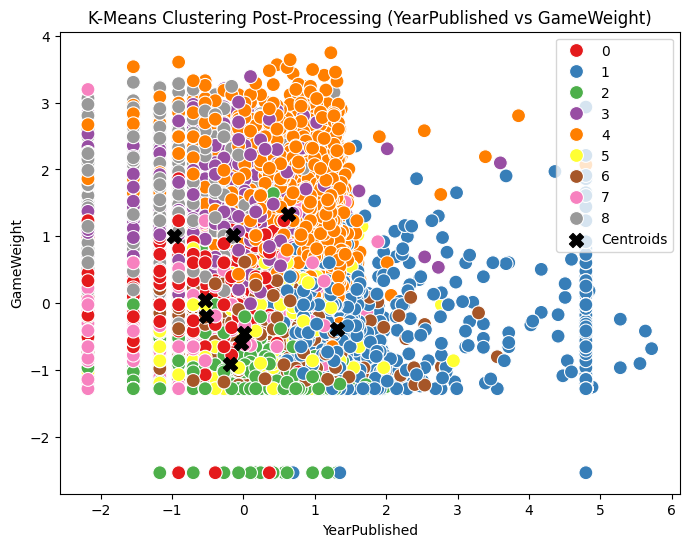

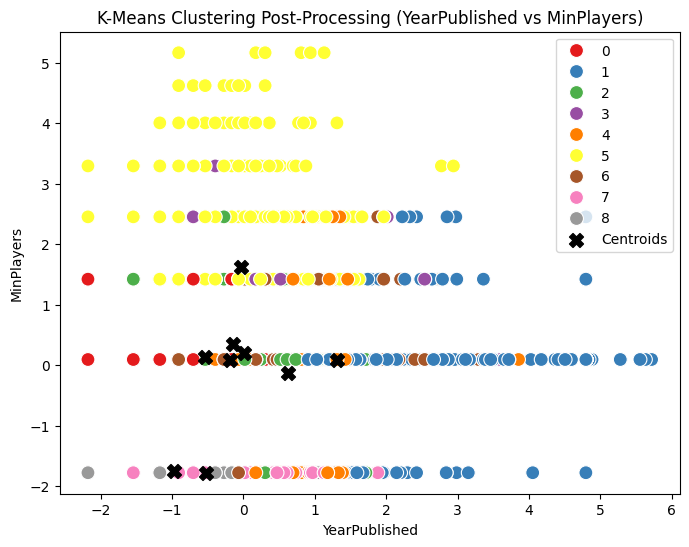

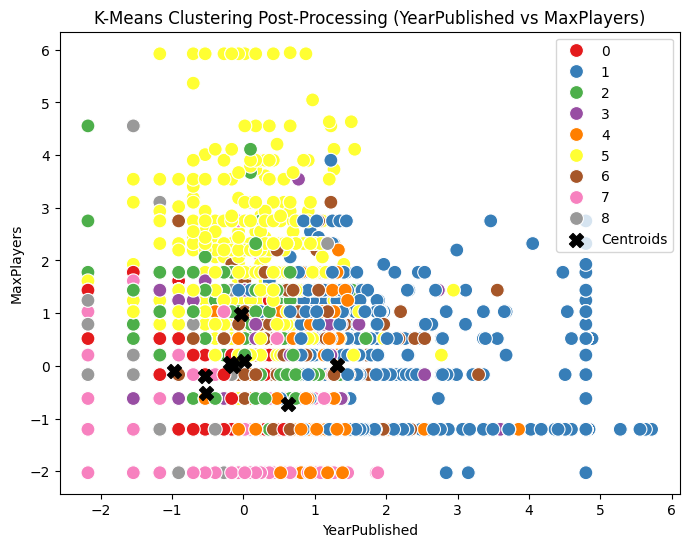

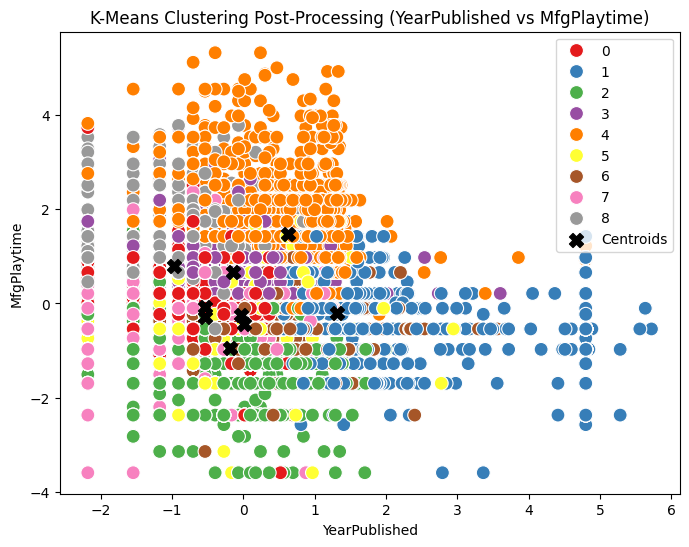

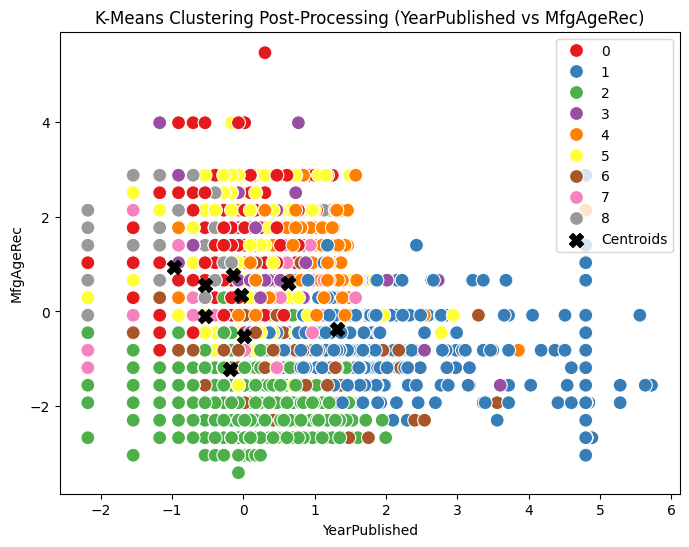

...

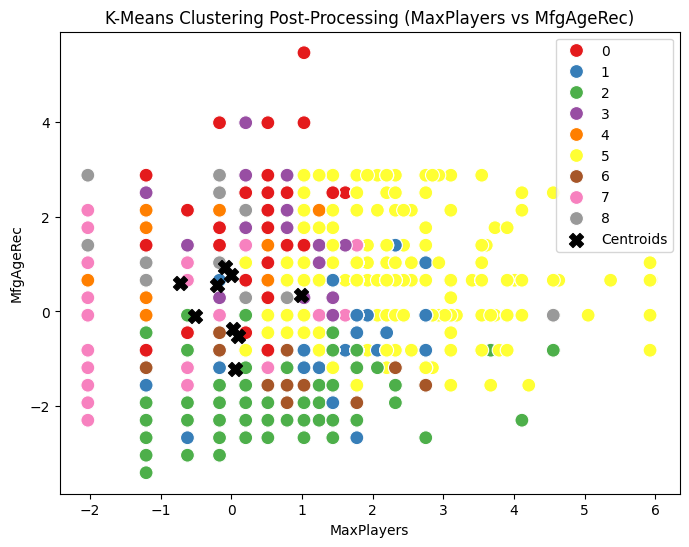

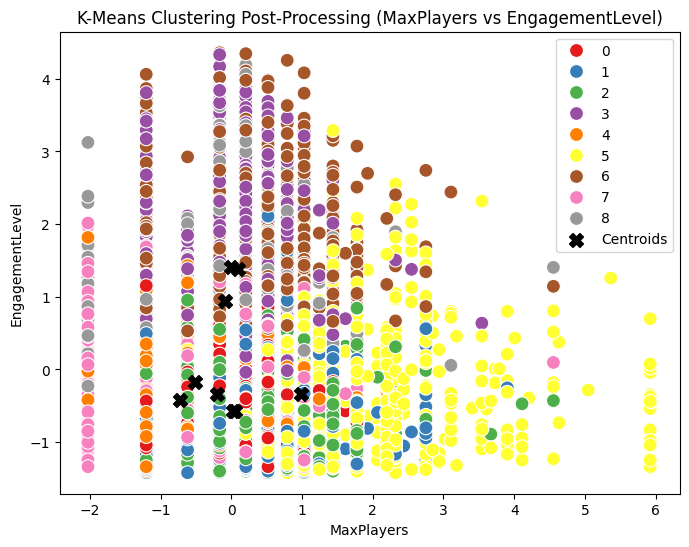

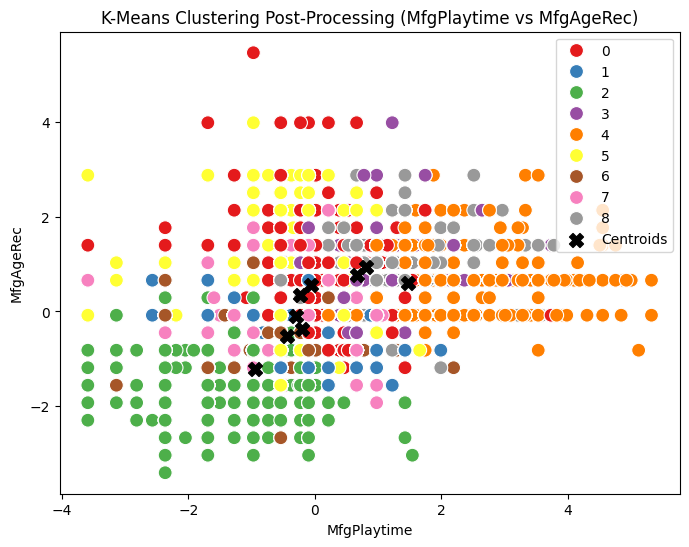

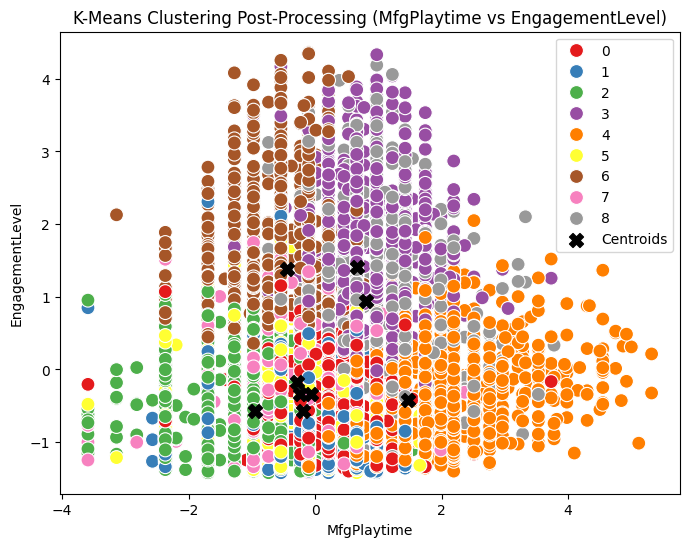

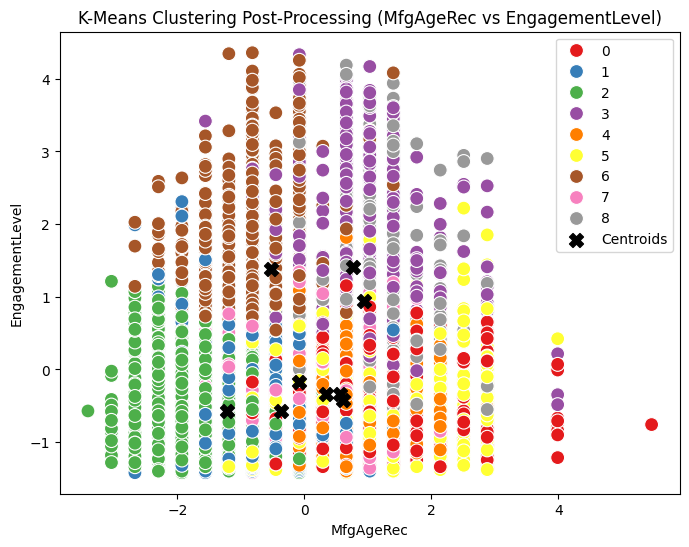

In [ ]:
# plot the new clusters for each combination of two features (only first 2 for visualization)
mapping_features = df_num.columns.tolist()
plt.figure(figsize=(10, 6))
for i in range(X_scaled.shape[1]):
    for j in range(i + 1, X_scaled.shape[1]):
        plt.figure(figsize=(8, 6))
        sns.scatterplot(x=X_scaled[:, i], y=X_scaled[:, j], hue=model_pp.labels_, palette='Set1', s=100)
        plt.scatter(model_pp.cluster_centers_[:, i], model_pp.cluster_centers_[:, j], c='black', s=100, marker='X', label='Centroids')
        plt.title(f'K-Means Clustering Post-Processing ({mapping_features[i]} vs {mapping_features[j]})')
        plt.xlabel(f'{mapping_features[i]}')
        plt.ylabel(f'{mapping_features[j]}')
        plt.legend()
        plt.show()

## 2. Bisecting K-Means

In [5]:
# Bisecting K-Means
from sklearn.cluster import BisectingKMeans

bkmeans = BisectingKMeans(n_clusters=7, n_init=10, max_iter=100, random_state=94)
bkmeans.fit(X_scaled)

,n_clusters,7
,init,'random'
,n_init,10
,random_state,94
,max_iter,100
,verbose,0
,tol,0.0001
,copy_x,True
,algorithm,'lloyd'
,bisecting_strategy,'biggest_inertia'


In [6]:
centers = scaler.inverse_transform(bkmeans.cluster_centers_)
centers

array([[ 2.89355357,  2.90996694,  1.0590583 ,  1.42109716,  4.95178655,
        11.79321126,  4.2778632 ],
       [ 1.89225815,  2.48407102,  1.12746329,  1.64905824,  4.21986035,
        12.29108135,  6.2621346 ],
       [ 1.36706687,  2.51900811,  0.69314718,  1.56642189,  4.30717733,
        12.178125  ,  5.80766282],
       [ 2.32266595,  1.47420169,  1.14790869,  4.43563865,  3.4921569 ,
        10.4185022 ,  4.42665167],
       [ 2.54094316,  1.52867819,  1.31251087,  2.0743389 ,  3.67925825,
        10.75715072,  4.41915289],
       [ 3.17840624,  1.43508036,  1.06906261,  1.59315699,  3.23097634,
         7.54250424,  3.96460437],
       [ 1.74445644,  1.54778181,  1.04178477,  1.68320516,  3.35975919,
         8.36049661,  4.94241072]])

In [7]:
print('SSE', bkmeans.inertia_)
print('Silhouette', silhouette_score(X_scaled, bkmeans.labels_))

SSE 83589.56464493112
Silhouette 0.12780496059328558


In [8]:
%%time
sse_list = []

for k in range(2, 51):
    kmeans = BisectingKMeans(n_clusters=k, n_init=10, max_iter=100, random_state = 42)
    kmeans.fit(X_scaled)
    sse_list.append(kmeans.inertia_)

CPU times: total: 22min 23s
Wall time: 4min 5s


In [9]:
%%time
sil_list = []

for k in range(2, 51):
    kmeans = BisectingKMeans(n_clusters=k, n_init=10, max_iter=100, random_state = 42)
    kmeans.fit(X_scaled)
    sil_list.append(silhouette_score(X_scaled, kmeans.labels_))

CPU times: total: 43min 2s
Wall time: 12min 53s


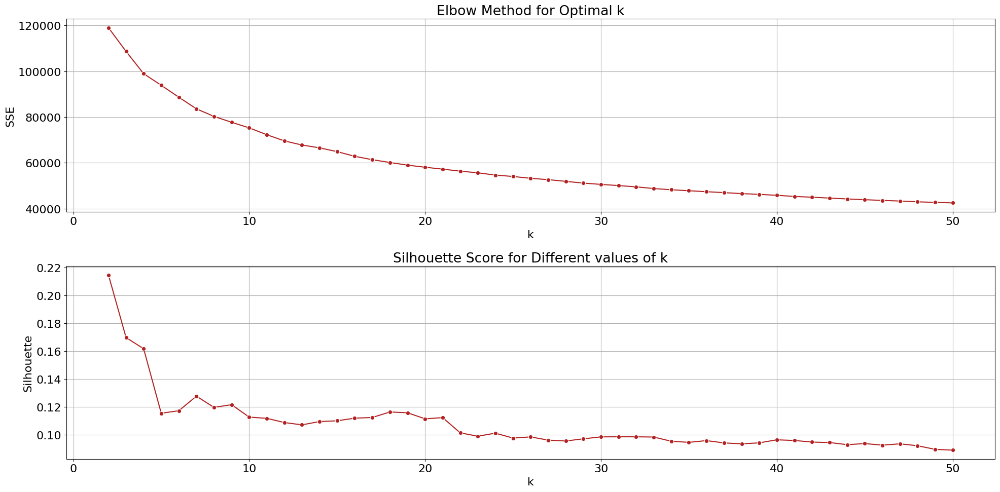

In [18]:
plt.rcParams['font.size'] =16
fig, axs = plt.subplots(2, figsize=(20, 10))
axs[0].grid(True)
axs[1].grid(True)

sns.lineplot(x=range(2,51), y=sse_list, marker='o', ax=axs[0], color='firebrick')
axs[0].set(xlabel='k', ylabel='SSE')
axs[0].set_title('Elbow Method for Optimal k')

sns.lineplot(x=range(2,51), y=sil_list, marker='o', ax=axs[1], color='firebrick')
axs[1].set(xlabel='k', ylabel='Silhouette')
axs[1].set_title('Silhouette Score for Different values of k')

plt.tight_layout() # Adjust the padding between and around subplots
plt.show()

<Figure size 1000x600 with 0 Axes>

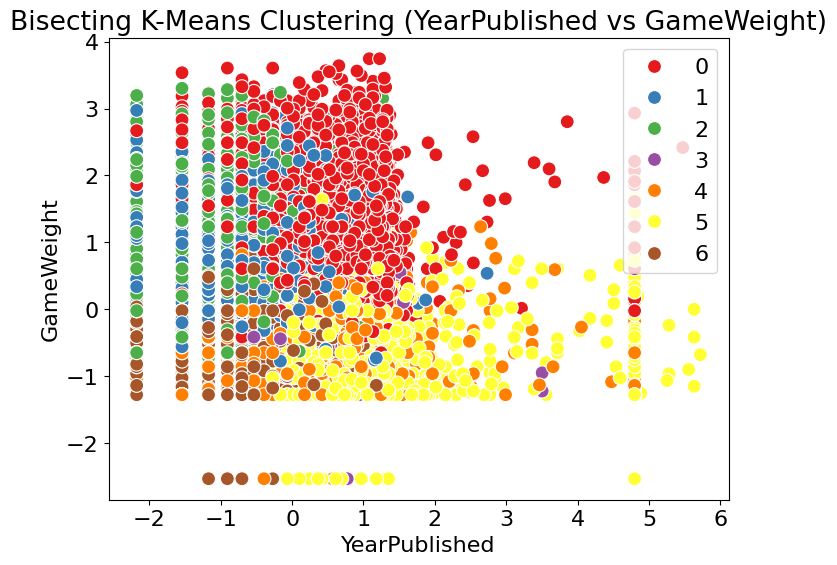

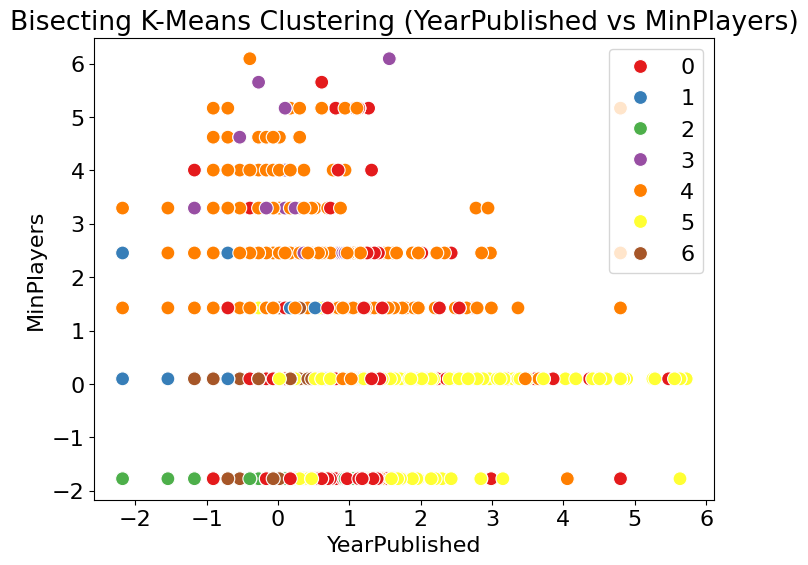

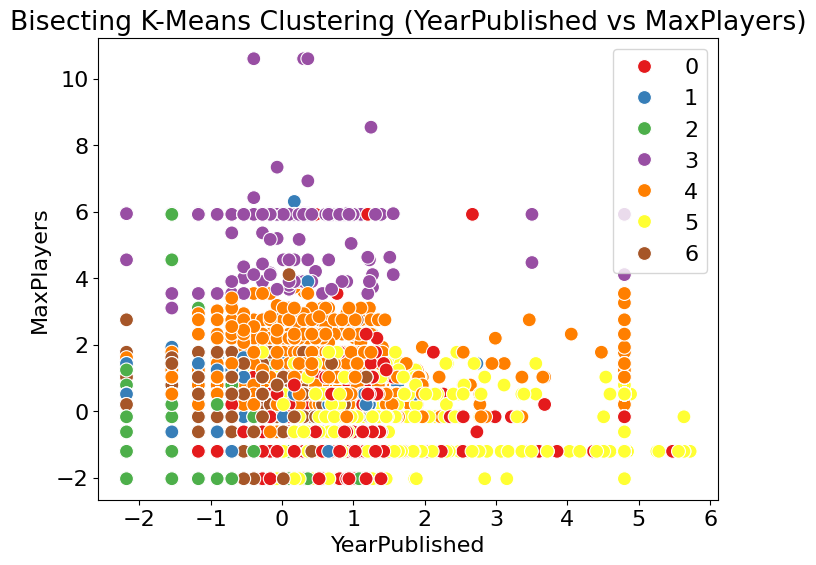

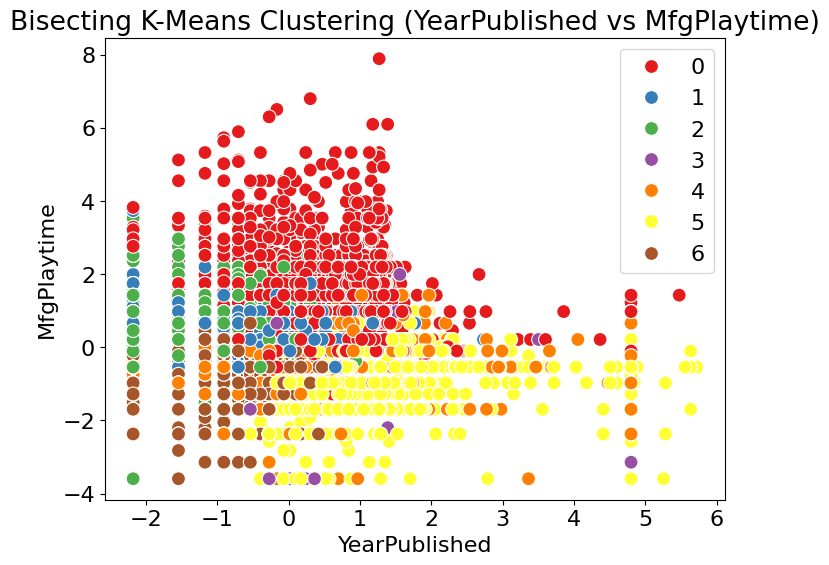

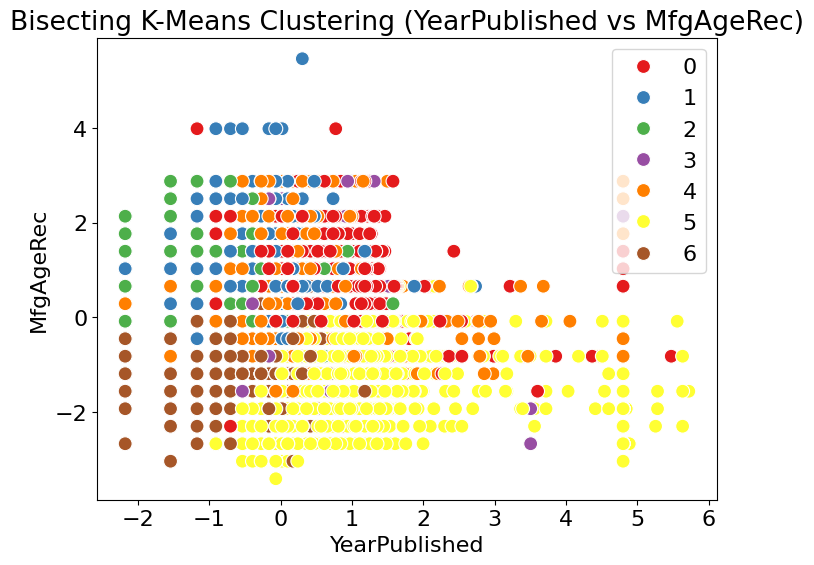

...

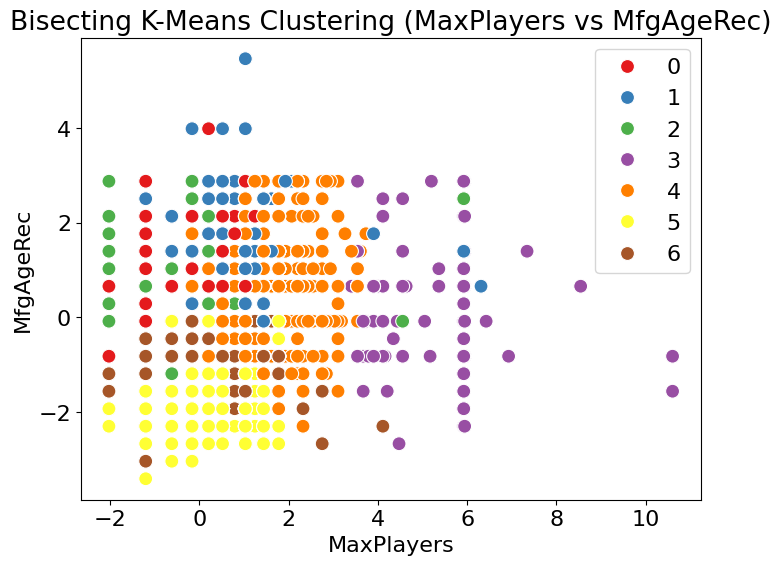

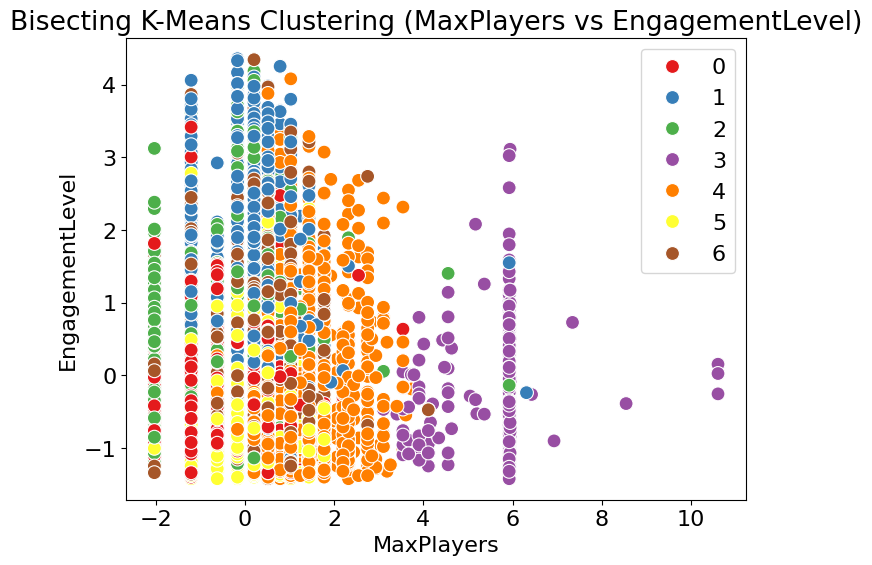

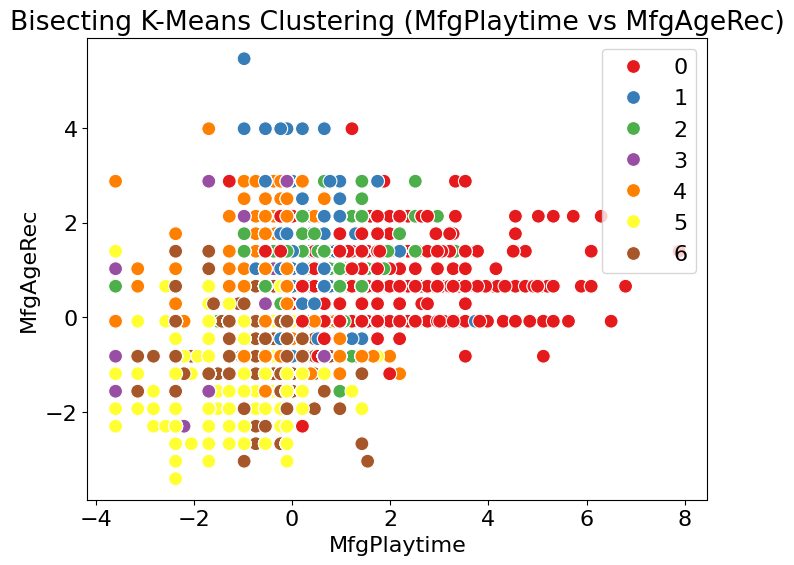

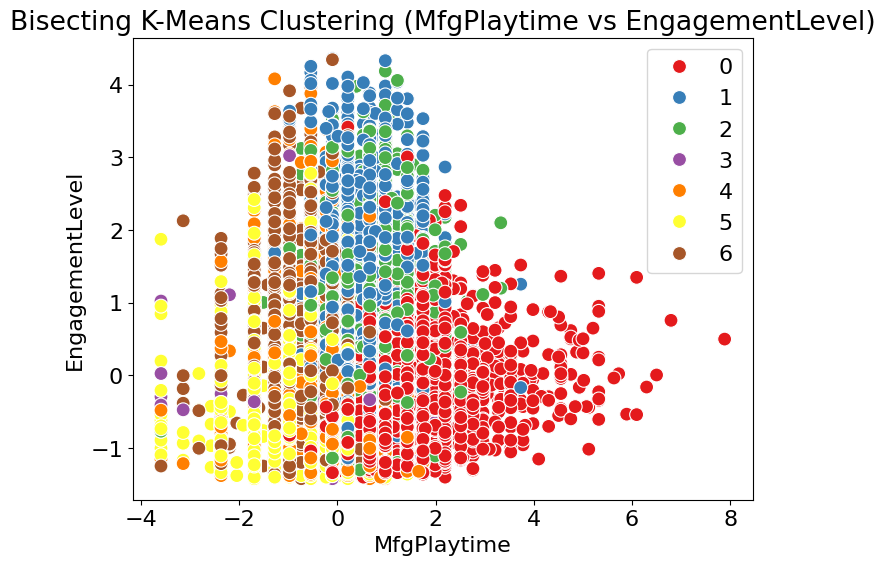

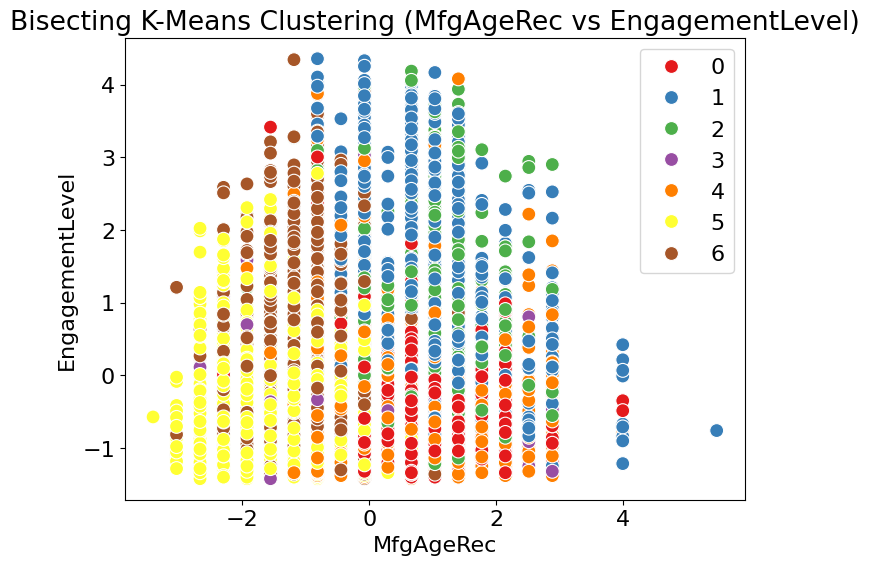

In [118]:
# plot cluster for each combination of two features (only first 2 for visualization)
mapping_features = df_num.columns.tolist()
plt.figure(figsize=(10, 6))
for i in range(X_scaled.shape[1]):
    for j in range(i + 1, X_scaled.shape[1]):
        plt.figure(figsize=(8, 6))
        sns.scatterplot(x=X_scaled[:, i], y=X_scaled[:, j], hue=bkmeans.labels_, palette='Set1', s=100)
        #plt.scatter(bkmeans.cluster_centers_[:, i], bkmeans.cluster_centers_[:, j], c='black', s=100, marker='X', label='Centroids')
        plt.title(f'Bisecting K-Means Clustering ({mapping_features[i]} vs {mapping_features[j]})')
        plt.xlabel(f'{mapping_features[i]}')
        plt.ylabel(f'{mapping_features[j]}')
        plt.legend()
        plt.show()

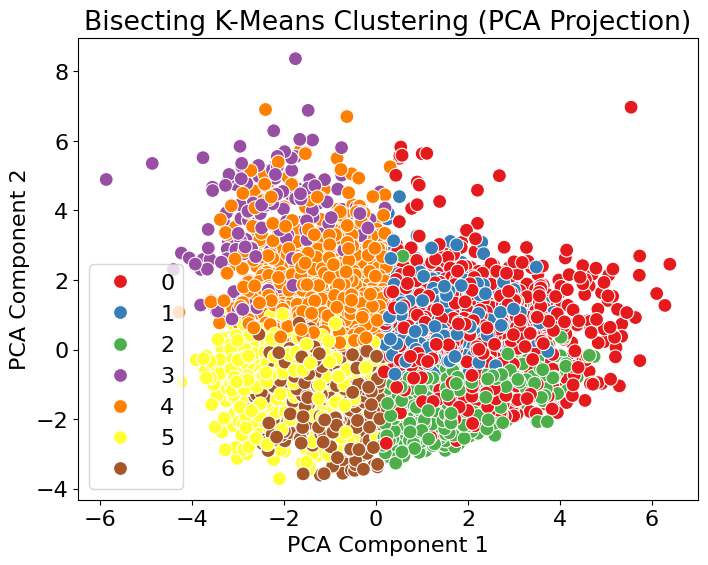

Varianza spiegata dalla PC1: 32.65%
Varianza spiegata dalla PC2: 17.43%


In [ ]:
# PCA visualization
from sklearn.decomposition import PCA
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_scaled)
plt.figure(figsize=(8, 6))
sns.scatterplot(x=X_pca[:, 0], y=X_pca[:, 1], hue=bkmeans.labels_, palette='Set1', s=100)
plt.title('Bisecting K-Means Clustering (PCA Projection)')
plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')
plt.legend()
plt.show()
# variance explained
expl_var = pca.explained_variance_ratio_
print(f"Varianza spiegata dalla PC1: {expl_var[0]:.2%}")
print(f"Varianza spiegata dalla PC2: {expl_var[1]:.2%}")
print(f"Varianza spiegata totale: {sum(expl_var):.2%}")



## Analyzing clusters

(21879, 7)
21879
Inverting log transformations for readability...

--- Cluster Summary (Mean Values) ---


Cluster,0,1,2,3,4,5,6
YearPublished,2002.00,2015.00,2018.00,2013.00,2009.00,2003.00,2016.00
GameWeight,2.86,2.43,2.42,1.30,1.50,1.33,1.50
MinPlayers,2.00,2.00,1.00,2.00,3.00,2.00,2.00
MaxPlayers,2.00,4.00,4.00,99.00,6.00,4.00,4.00
MfgPlaytime,120.00,60.00,70.00,30.00,45.00,30.00,30.00
MfgAgeRec,12.00,12.00,12.00,10.00,10.00,8.00,8.00
EngagementLevel,4.12,6.16,5.63,4.18,4.12,3.75,4.71
Count,4476.00,3061.00,1920.00,227.00,3636.00,4121.00,4438.00
% Total,20.46,13.99,8.78,1.04,16.62,18.84,20.28


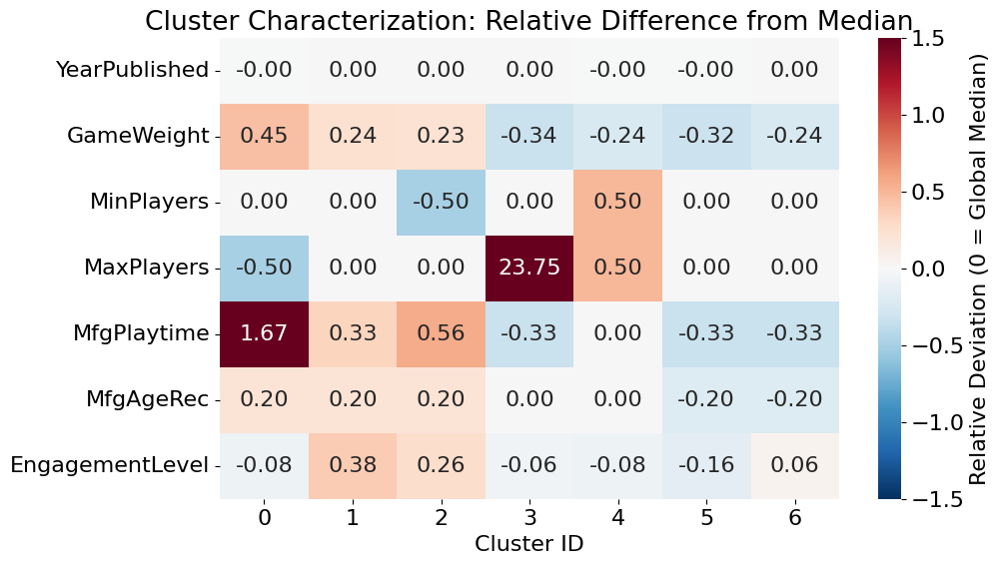

C:\Users\leona\AppData\Local\Temp\ipykernel_19716\735077840.py:73: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Cluster', y=col, data=df_analysis, ax=axes[i], palette='tab10')
C:\Users\leona\AppData\Local\Temp\ipykernel_19716\735077840.py:73: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Cluster', y=col, data=df_analysis, ax=axes[i], palette='tab10')
C:\Users\leona\AppData\Local\Temp\ipykernel_19716\735077840.py:73: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Cluster', y=col, data=df_analysis, ax=axes[i], palette='tab10')
C:\User

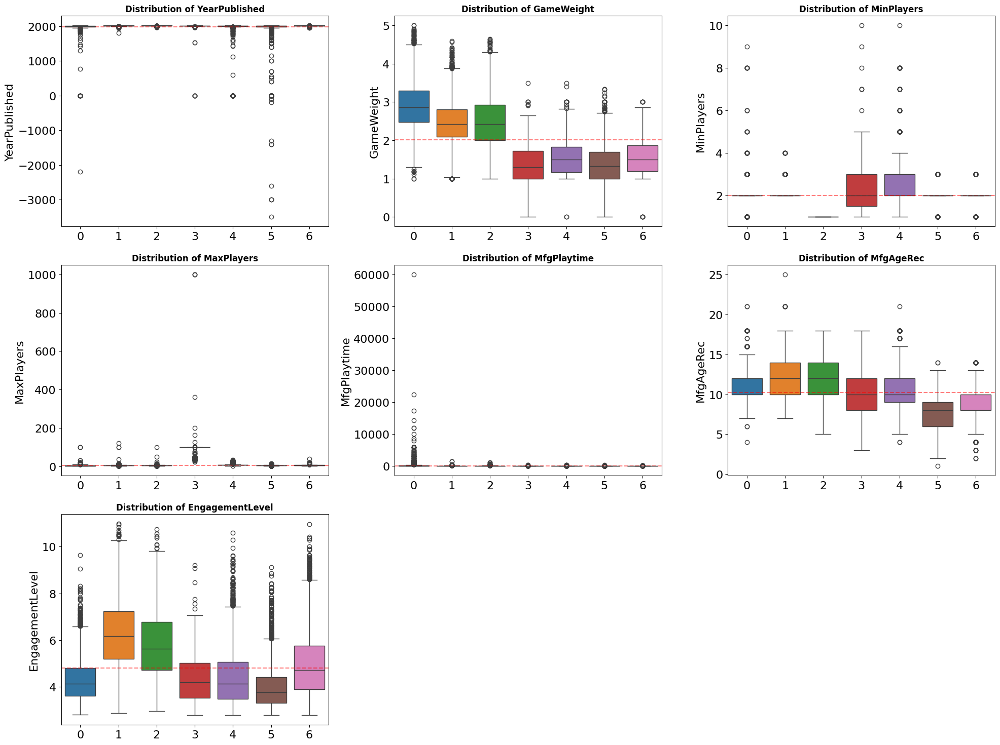


--- Analysis for Cluster 0 ---


,count,mean,std,min,25%,50%,75%,max
YearPublished,4476.0,1987.48,156.12,-2200.0,1988.00,2002.00,2012.0,2021.00
GameWeight,4476.0,2.91,0.63,1.0,2.48,2.86,3.3,5.00
MinPlayers,4476.0,1.94,0.58,1.0,2.00,2.00,2.0,9.00
MaxPlayers,4476.0,3.58,3.52,1.0,2.00,2.00,5.0,99.00
MfgPlaytime,4476.0,261.05,1152.75,10.0,90.00,120.00,240.0,60000.00
MfgAgeRec,4476.0,11.79,1.50,4.0,10.00,12.00,12.0,21.00
EngagementLevel,4476.0,4.28,0.89,2.8,3.61,4.12,4.8,9.64



--- Analysis for Cluster 1 ---


,count,mean,std,min,25%,50%,75%,max
YearPublished,3061.0,2013.07,8.14,1810.00,2010.00,2015.00,2018.00,2021.00
GameWeight,3061.0,2.48,0.55,1.00,2.09,2.43,2.80,4.59
MinPlayers,3061.0,2.10,0.31,2.00,2.00,2.00,2.00,4.00
MaxPlayers,3061.0,4.50,3.59,2.00,4.00,4.00,5.00,120.00
MfgPlaytime,3061.0,76.98,55.70,10.00,45.00,60.00,90.00,1440.00
MfgAgeRec,3061.0,12.29,1.99,7.00,10.00,12.00,14.00,25.00
EngagementLevel,3061.0,6.26,1.47,2.86,5.20,6.16,7.24,10.98



--- Analysis for Cluster 2 ---


,count,mean,std,min,25%,50%,75%,max
YearPublished,1920.0,2016.50,5.71,1962.00,2015.00,2018.00,2020.00,2021.00
GameWeight,1920.0,2.52,0.65,1.00,2.00,2.42,2.92,4.65
MinPlayers,1920.0,1.00,0.00,1.00,1.00,1.00,1.00,1.00
MaxPlayers,1920.0,4.17,2.98,1.00,4.00,4.00,5.00,99.00
MfgPlaytime,1920.0,90.15,76.06,1.00,45.00,70.00,120.00,1200.00
MfgAgeRec,1920.0,12.18,1.92,5.00,10.00,12.00,14.00,18.00
EngagementLevel,1920.0,5.81,1.44,2.94,4.71,5.63,6.78,10.74



--- Analysis for Cluster 3 ---


,count,mean,std,min,25%,50%,75%,max
YearPublished,227.0,1969.55,268.39,-0.00,2006.00,2013.00,2016.50,2021.00
GameWeight,227.0,1.47,0.54,0.00,1.00,1.30,1.73,3.50
MinPlayers,227.0,2.38,1.42,1.00,1.50,2.00,3.00,10.00
MaxPlayers,227.0,99.19,109.32,24.00,99.00,99.00,99.00,999.00
MfgPlaytime,227.0,44.87,46.16,1.00,20.00,30.00,45.00,360.00
MfgAgeRec,227.0,10.42,3.41,3.00,8.00,10.00,12.00,18.00
EngagementLevel,227.0,4.43,1.17,2.77,3.51,4.18,5.01,9.21



--- Analysis for Cluster 4 ---


,count,mean,std,min,25%,50%,75%,max
YearPublished,3636.0,1972.35,253.94,-0.00,2000.00,2009.00,2015.00,2021.00
GameWeight,3636.0,1.53,0.42,0.00,1.17,1.50,1.83,3.50
MinPlayers,3636.0,2.80,0.84,1.00,2.00,3.00,3.00,10.00
MaxPlayers,3636.0,7.46,3.50,2.00,6.00,6.00,8.00,33.00
MfgPlaytime,3636.0,44.74,27.40,1.00,30.00,45.00,60.00,360.00
MfgAgeRec,3636.0,10.76,2.38,4.00,9.00,10.00,12.00,21.00
EngagementLevel,3636.0,4.42,1.21,2.77,3.48,4.12,5.06,10.59



--- Analysis for Cluster 5 ---


,count,mean,std,min,25%,50%,75%,max
YearPublished,4121.0,1929.21,384.14,-3500.00,1988.0,2003.00,2009.0,2018.00
GameWeight,4121.0,1.43,0.44,0.00,1.0,1.33,1.7,3.33
MinPlayers,4121.0,1.93,0.31,1.00,2.0,2.00,2.0,3.00
MaxPlayers,4121.0,4.20,1.74,1.00,4.0,4.00,5.0,15.00
MfgPlaytime,4121.0,29.53,21.19,1.00,15.0,30.00,30.0,360.00
MfgAgeRec,4121.0,7.54,2.06,1.00,6.0,8.00,9.0,14.00
EngagementLevel,4121.0,3.96,0.89,2.77,3.3,3.75,4.4,9.11



--- Analysis for Cluster 6 ---


,count,mean,std,min,25%,50%,75%,max
YearPublished,4438.0,2014.65,5.64,1949.00,2013.00,2016.00,2018.00,2021.00
GameWeight,4438.0,1.55,0.41,0.00,1.20,1.50,1.88,3.00
MinPlayers,4438.0,1.86,0.38,1.00,2.00,2.00,2.00,3.00
MaxPlayers,4438.0,4.64,1.81,1.00,4.00,4.00,6.00,40.00
MfgPlaytime,4438.0,31.53,17.16,1.00,20.00,30.00,45.00,200.00
MfgAgeRec,4438.0,8.36,1.66,2.00,8.00,8.00,10.00,14.00
EngagementLevel,4438.0,4.94,1.33,2.77,3.88,4.71,5.76,10.96


In [19]:
# --- 1. Preparazione dei Dati per l'Analisi ---
# Copiamo il dataset filtrato per non sporcare l'originale
df_analysis = df_num.copy()
print(df_analysis.shape)
# Aggiungiamo le etichette dei cluster trovati
# Assicurati che 'kmeans' sia il tuo modello fittato e 'X_final' i dati usati
print(len(bkmeans.labels_))
df_analysis['Cluster'] = bkmeans.labels_

# --- IMPORTANTE: Inversione delle trasformazioni ---
# Per interpretare i dati, dobbiamo tornare ai valori originali (non logaritmici)
# Se hai la lista 'log_cols' dal tuo codice precedente:
if 'log_cols' in locals():
    print("Inverting log transformations for readability...")
    for col in log_cols:
        if col in df_analysis.columns:
            # Applichiamo expm1 (inverso di log1p)
            df_analysis[col] = np.expm1(df_analysis[col])

# ritraformazione di YearPublished in 'Anno' invece di 'Recency'
if 'YearPublished' in df_analysis.columns:
    df_analysis['YearPublished'] = df['YearPublished'].max() - df_analysis['YearPublished']

# --- 2. Tabella Riassuntiva (Centroidi Reali) ---
# Calcoliamo la mediana di ogni feature per ogni cluster
cluster_medians = df_analysis.groupby('Cluster').median()
cluster_counts = df_analysis['Cluster'].value_counts().sort_index()

# Aggiungiamo la dimensione del cluster per contesto
cluster_summary = cluster_medians.copy()
cluster_summary['Count'] = cluster_counts
cluster_summary['% Total'] = (cluster_counts / len(df_analysis)) * 100

print("\n--- Cluster Summary (Mean Values) ---")
# Trasponiamo per leggere meglio se hai tante colonne
display(cluster_summary.T.round(2))


# --- 3. Heatmap delle Differenze Relative (Profilazione) ---
# Questa visualizzazione risponde a: "In cosa questo cluster è diverso dalla mediana globale?"
# Rosso = Molto sopra la mediana, Blu = Molto sotto la mediana

global_median = df_analysis.drop(columns=['Cluster']).median()
# Calcoliamo la deviazione percentuale dalla mediana globale
relative_imp = (cluster_medians - global_median) / global_median

plt.figure(figsize=(10, 6))
sns.heatmap(data=relative_imp.T, 
            cmap='RdBu_r', 
            center=0, 
            annot=True, 
            fmt=".2f",
            vmax=1.5, vmin=-1.5, # Limita i colori estremi per leggibilità
            cbar_kws={'label': 'Relative Deviation (0 = Global Median)'})
plt.title('Cluster Characterization: Relative Difference from Median')
plt.xlabel('Cluster ID')
plt.show()


# --- 4. Boxplots Dettagliati (Distribuzione) ---
# I boxplot sono fondamentali per vedere se un cluster è "compatto" o "disperso"
# Creiamo un grafico per ogni feature numerica

features_to_plot = [col for col in df_analysis.columns if col not in ['Cluster']]
n_features = len(features_to_plot)
n_cols = 3
n_rows = (n_features + n_cols - 1) // n_cols

fig, axes = plt.subplots(n_rows, n_cols, figsize=(20, 5 * n_rows))
axes = axes.flatten()

for i, col in enumerate(features_to_plot):
    sns.boxplot(x='Cluster', y=col, data=df_analysis, ax=axes[i], palette='tab10')
    axes[i].set_title(f'Distribution of {col}', fontsize=12, fontweight='bold')
    axes[i].set_xlabel('')
    
    # Linea tratteggiata rossa per la media globale
    global_avg = df_analysis[col].mean()
    axes[i].axhline(global_avg, color='red', linestyle='--', alpha=0.5, label='Global Avg')

# Rimuovi assi vuoti se ce ne sono
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

# --- 5. Analisi divisa per Cluster ---
for cluster_id in sorted(df_analysis['Cluster'].unique()):
    print(f"\n--- Analysis for Cluster {cluster_id} ---")
    cluster_data = df_analysis[df_analysis['Cluster'] == cluster_id]
    # display statistics without the Cluster column
    display(cluster_data.drop(columns=['Cluster']).describe().T.round(2))

## Observing clusters-categories relations

In [21]:
# check if clusters match some categorical features
# --- IGNORE ---
for i in range(len(set(bkmeans.labels_))):
    cluster = np.where(bkmeans.labels_ == i)[0]
    cluster_indices = cluster
    cluster_data = df.iloc[cluster_indices]
    print(f"Cluster {i}:")
    print(f" Number of items: {len(cluster_data)}")
    for col in ['HasFamily', 'Category', 'Rating', 'Kickstarted', 'IsReimplementation','Rank','NumImplementations','NumExpansions','NumAlternates']:
        if col == 'Rank':
            median_rank = cluster_data[col].median()
            print(f"  Median {col}: {median_rank}")
            continue
        if col == 'NumImplementations':
            median_imp= cluster_data[col].median()
            print(f"  Median {col}: {median_imp}")
            continue
        if col == 'NumExpansions':
            median_exp = cluster_data[col].median()
            print(f"  Median {col}: {median_exp}")
            continue
        if col == 'NumAlternates':
            median_alt = cluster_data[col].median()
            print(f"  Median {col}: {median_alt}")
            continue
        
        value_counts = cluster_data[col].value_counts(normalize=True) * 100
        print(f"  {col} distribution:")
        print(value_counts)
    print("\n")   

Cluster 0:
 Number of items: 4476
  HasFamily distribution:
HasFamily
0    62.243074
1    37.756926
Name: proportion, dtype: float64
  Category distribution:
Category
War           59.763181
NoCategory    23.860590
Strategy       6.791778
Thematic       4.133155
Abstract       2.993744
CGS            1.474531
Family         0.871314
Party          0.089366
Childrens      0.022341
Name: proportion, dtype: float64
  Rating distribution:
Rating
Medium    45.978552
High      32.618409
Low       21.403038
Name: proportion, dtype: float64
  Kickstarted distribution:
Kickstarted
0    92.962466
1     7.037534
Name: proportion, dtype: float64
  IsReimplementation distribution:
IsReimplementation
0    89.991063
1    10.008937
Name: proportion, dtype: float64
  Median Rank: 2166.5
  Median NumImplementations: 0.0
  Median NumExpansions: 0.0
  Median NumAlternates: 0.0


Cluster 1:
 Number of items: 3061
  HasFamily distribution:
HasFamily
0    62.528585
1    37.471415
Name: proportion, dtype: flo

## Correlation statistical evaluation

In [ ]:
N = 500
corr_stats = []

for _ in range(N):
    Xi = np.zeros(shape=X_scaled.shape)

    for cidx in range(Xi.shape[1]):
        col = X_scaled[:, cidx]
        min, max, nor = np.min(col), np.max(col), len(col)
        Xi[:, cidx] = np.random.uniform(min, max, (1, nor))

    kmeans = KMeans(n_clusters=3, n_init=10, max_iter=100, random_state=94)
    kmeans.fit(Xi)
    # compute correlation matrix (distance matrix - 0-1 matrix)
    # distance matrix
    dist_matrix = squareform(pdist(Xi))
    # cluster belonging matrix (1 if same cluster, 0 otherwise)
    cluster_matrix = np.equal.outer(kmeans.labels_, kmeans.labels_).astype(int)
    corr = np.corrcoef(dist_matrix.flatten(), cluster_matrix.flatten())[0, 1]
    corr_stats.append(corr)

In [ ]:
plt.hist(corr_stats, bins='auto')
plt.vlines(x = 0, ymin = 0, ymax = 60, colors = 'purple', label = 'computed correlation = 0')
plt.xlabel('Correlation Coefficient')
plt.ylabel('Count')
plt.legend()
plt.show()

## Postprocessing

In [ ]:
# FUNCTIONS FOR KMEANS POST-PROCESSING
# ===========================================================
# 1. Calcola SSE (Sum of Squared Errors) per ciascun cluster
# ===========================================================
def compute_cluster_sse(X, labels, centroids):
    sse = []
    for k in range(len(centroids)):
        cluster_points = X[labels == k]
        if len(cluster_points) == 0:
            sse.append(0)
        else:
            distances = np.linalg.norm(cluster_points - centroids[k], axis=1)
            sse.append(np.sum(distances**2))
    return np.array(sse)


# ===========================================================
# 2. Identifica cluster piccoli (micro-cluster)
#    threshold = minimo numero di punti richiesti
# ===========================================================
def find_small_clusters(labels, min_size_ratio=0.05):
    n = len(labels)
    unique, counts = np.unique(labels, return_counts=True)
    small = unique[counts < min_size_ratio * n]
    return small.tolist()


# ===========================================================
# 3. Dividi cluster con alta SSE interna
#    Usa un secondo KMeans con k=2 nel cluster problematico
# ===========================================================
def split_high_sse_clusters(X, labels, centroids, sse, factor=2.0):
    median_sse = np.median(sse)
    clusters_to_split = np.where(sse > factor * median_sse)[0]

    new_labels = labels.copy()
    new_centroids = []

    # Ricalcoliamo cluster uno per uno
    current_label = 0
    for k in range(len(centroids)):
        points = X[new_labels == k]

        # Split solo se necessario
        if k in clusters_to_split and len(points) >= 4:
            sub_kmeans = KMeans(n_clusters=2, random_state=42).fit(points)
            # Rimappi i cluster locali alla numerazione globale
            for i, label_val in enumerate(sub_kmeans.labels_):
                idx = np.where(new_labels == k)[0][i]
                new_labels[idx] = current_label + label_val
            # Aggiungi i centroidi locali
            new_centroids.append(sub_kmeans.cluster_centers_[0])
            new_centroids.append(sub_kmeans.cluster_centers_[1])
            current_label += 2
        else:
            # Nessuno split → mantieni cluster
            new_labels[new_labels == k] = current_label
            new_centroids.append(centroids[k])
            current_label += 1

    return np.array(new_labels), np.array(new_centroids)


# ===========================================================
# 4. Unisci cluster simili (centroidi troppo vicini)
# ===========================================================
def merge_similar_clusters(X, labels, centroids, distance_threshold_ratio=0.5):

    # distanza media tra centroidi
    dist_matrix = cdist(centroids, centroids, metric='euclidean')
    avg_dist = np.mean(dist_matrix[dist_matrix > 0])

    to_merge = []
    for i in range(len(centroids)):
        for j in range(i+1, len(centroids)):
            if dist_matrix[i, j] < distance_threshold_ratio * avg_dist:
                to_merge.append((i, j))

    # Nessun merge necessario
    if not to_merge:
        return labels, centroids

    # Merge effettivo
    new_labels = labels.copy()
    merged = set()
    new_centroids = []

    for (i, j) in to_merge:
        if i in merged or j in merged:
            continue

        pts = X[(labels == i) | (labels == j)]
        new_center = pts.mean(axis=0)
        new_id = len(new_centroids)
        new_centroids.append(new_center)

        new_labels[(labels == i) | (labels == j)] = new_id
        merged.add(i); merged.add(j)

    # Aggiungi cluster non mergeati
    for k in range(len(centroids)):
        if k not in merged:
            new_id = len(new_centroids)
            new_centroids.append(centroids[k])
            new_labels[labels == k] = new_id

    return np.array(new_labels), np.array(new_centroids)


# ===========================================================
# 5. Riesegui KMeans usando i nuovi centroidi aggiornati
# ===========================================================
def rerun_kmeans_with_centroids(X, centroids):
    k = len(centroids)
    kmeans = KMeans(n_clusters=k, init=centroids, n_init=1, random_state=42)
    new_labels = kmeans.fit_predict(X)
    return kmeans


# ===========================================================
# 6. Pipeline completa di post-processing
# ===========================================================
def kmeans_postprocessing_pipeline(X, labels, centroids,
                                   min_size_ratio=0.05,
                                   split_factor=2.0,
                                   merge_ratio=0.5):
    
    # Step 1: SSE
    sse = compute_cluster_sse(X, labels, centroids)

    # Step 2: Rimuovi/rialloca cluster piccoli
    small_clusters = find_small_clusters(labels, min_size_ratio=min_size_ratio)
    if small_clusters:
        for c in small_clusters:
            # Ri-assegna i punti al centroide più vicino
            idx = np.where(labels == c)[0]
            _, nearest_centroids = pairwise_distances_argmin_min(
                X[idx], np.delete(centroids, c, axis=0)
            )
            labels[idx] = nearest_centroids

    # Step 3: Split cluster con alta SSE
    labels, centroids = split_high_sse_clusters(X, labels, centroids, sse, factor=split_factor)

    # Step 4: Merge cluster simili
    labels, centroids = merge_similar_clusters(X, labels, centroids, distance_threshold_ratio=merge_ratio)

    # Step 5: Rilancia KMeans
    final_model = rerun_kmeans_with_centroids(X, centroids)

    return final_model


In [ ]:
# post-processing
# original number of cluster and cluster sizes
print("Final number of clusters:", kmeans.n_clusters)
print("Cluster sizes:", np.bincount(kmeans.labels_))

model_pp = kmeans_postprocessing_pipeline(
    X_scaled, labels, centroids,
    min_size_ratio=0.05,   # rimuovi cluster < 5%
    split_factor=2.0,      # split cluster con SSE > 2× mediana
    merge_ratio=0.5        # merge cluster con centroidi troppo vicini
)

# Risultati
print("Final number of clusters:", model_pp.n_clusters)
print("Cluster sizes:", np.bincount(model_pp.labels_))

In [ ]:
# plot the new clusters for each combination of two features (only first 2 for visualization)
mapping_features = df_num.columns.tolist()
plt.figure(figsize=(10, 6))
for i in range(X_scaled.shape[1]):
    for j in range(i + 1, X_scaled.shape[1]):
        plt.figure(figsize=(8, 6))
        sns.scatterplot(x=X_scaled[:, i], y=X_scaled[:, j], hue=model_pp.labels_, palette='Set1', s=100)
        plt.scatter(model_pp.cluster_centers_[:, i], model_pp.cluster_centers_[:, j], c='black', s=100, marker='X', label='Centroids')
        plt.title(f'K-Means Clustering Post-Processing ({mapping_features[i]} vs {mapping_features[j]})')
        plt.xlabel(f'{mapping_features[i]}')
        plt.ylabel(f'{mapping_features[j]}')
        plt.legend()
        plt.show()

## 3. X-Means

Avvio 100 iterazioni di X-Means per trovare il K stabile...

--- RISULTATI ANALISI STABILITÀ ---
K più frequente (Moda): 32
Stabilità: Apparso nel 17.0% delle esecuzioni (17/100)


C:\Users\leona\AppData\Local\Temp\ipykernel_11656\1748877307.py:63: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x='k', data=df_res, palette='viridis')


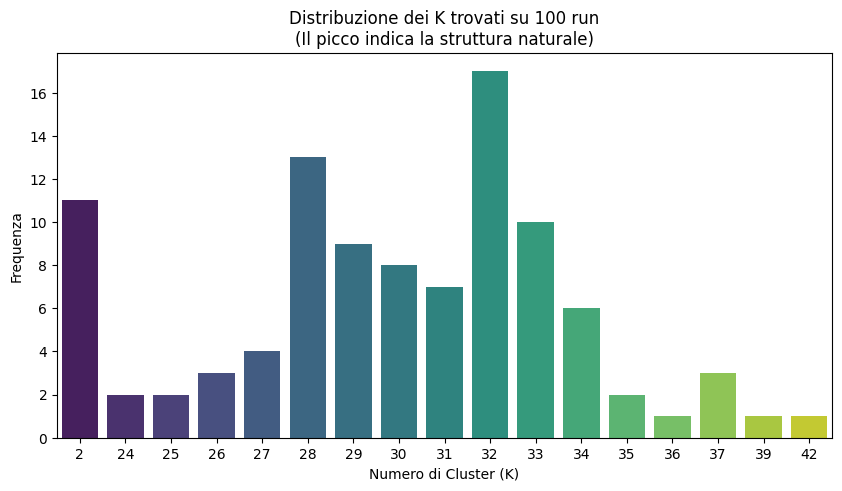


--- MODELLO SELEZIONATO ---
Selezionato il miglior modello tra quelli con K=32
Silhouette Score: 0.1518
SSE: 43744.33

Le etichette del modello finale sono state assegnate al dataset.


In [26]:
from pyclustering.cluster import xmeans
from pyclustering.cluster.center_initializer import kmeans_plusplus_initializer
import copy # Ci serve per salvare l'oggetto esatto

# Configurazione
n_iterations = 100
results = []
best_model_overall = None
best_sil_overall = -1

print(f"Avvio {n_iterations} iterazioni di X-Means per trovare il K stabile...")

for i in range(n_iterations):
    # 1. Inizializzazione (lasciamo casuale, tanto la variabilità è interna)
    # Partiamo sempre da 2 centri
    initial_centers = kmeans_plusplus_initializer(X_scaled, amount_centers=2).initialize()
    
    # 2. Run X-Means
    xm = xmeans.xmeans(X_scaled, initial_centers=initial_centers, kmax=50)
    xm.process()
    
    # 3. Estrazione risultati
    clusters = xm.get_clusters()
    n_clusters = len(clusters)
    
    # Calcolo metriche
    if 1 < n_clusters < len(X_scaled):
        # Convertiamo in labels per sklearn
        labels = np.empty(X_scaled.shape[0], dtype=int)
        for idx, cluster_indices in enumerate(clusters):
            labels[cluster_indices] = idx
            
        sil = silhouette_score(X_scaled, labels)
        sse = xm.get_total_wce()
        
        # Salviamo i risultati statistici
        results.append({
            'iteration': i, 
            'k': n_clusters, 
            'sil': sil, 
            'sse': sse,
            'centers': xm.get_centers() # Salviamo i centri per riprodurlo se serve
        })
        
        # Salvataggio temporaneo del miglior modello in assoluto (just in case)
        if sil > best_sil_overall:
            best_sil_overall = sil
            best_model_overall = copy.deepcopy(xm) # Salviamo l'istanza esatta

# --- ANALISI DEI RISULTATI ---
df_res = pd.DataFrame(results)

# 1. Trova la Moda (Il K più stabile)
k_counts = df_res['k'].value_counts()
most_frequent_k = k_counts.idxmax()
frequency = k_counts.max()
freq_percentage = (frequency / len(df_res)) * 100

print(f"\n--- RISULTATI ANALISI STABILITÀ ---")
print(f"K più frequente (Moda): {most_frequent_k}")
print(f"Stabilità: Apparso nel {freq_percentage:.1f}% delle esecuzioni ({frequency}/{len(df_res)})")

# 2. Visualizzazione della distribuzione dei K
plt.figure(figsize=(10, 5))
sns.countplot(x='k', data=df_res, palette='viridis')
plt.title(f'Distribuzione dei K trovati su {n_iterations} run\n(Il picco indica la struttura naturale)')
plt.xlabel('Numero di Cluster (K)')
plt.ylabel('Frequenza')
plt.show()

# 3. Selezione del "Best Representative Model"
# Filtriamo solo le run che hanno dato il K modale
stable_runs = df_res[df_res['k'] == most_frequent_k]

# Tra queste, prendiamo quella con la silhouette migliore
best_stable_run = stable_runs.sort_values('sil', ascending=False).iloc[0]

print(f"\n--- MODELLO SELEZIONATO ---")
print(f"Selezionato il miglior modello tra quelli con K={most_frequent_k}")
print(f"Silhouette Score: {best_stable_run['sil']:.4f}")
print(f"SSE: {best_stable_run['sse']:.2f}")

# 4. Recupero dei centroidi vincitori
# Invece di rieseguire (che rischierebbe di cambiare), usiamo i centri salvati
final_centers = best_stable_run['centers']

# Se vuoi avere le label pronte per l'analisi:
# Ricostruiamo le label finali dai centri vincitori usando una nearest centroid assignment
# (È il modo più sicuro per 'congelare' il risultato)
from sklearn.metrics import pairwise_distances_argmin

final_labels = pairwise_distances_argmin(X_scaled, final_centers)
df_num['Cluster_XMeans'] = final_labels

print(f"\nLe etichette del modello finale sono state assegnate al dataset.")

C:\Users\leona\AppData\Local\Temp\ipykernel_11656\1833618962.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x='k', data=df_res, palette='viridis')


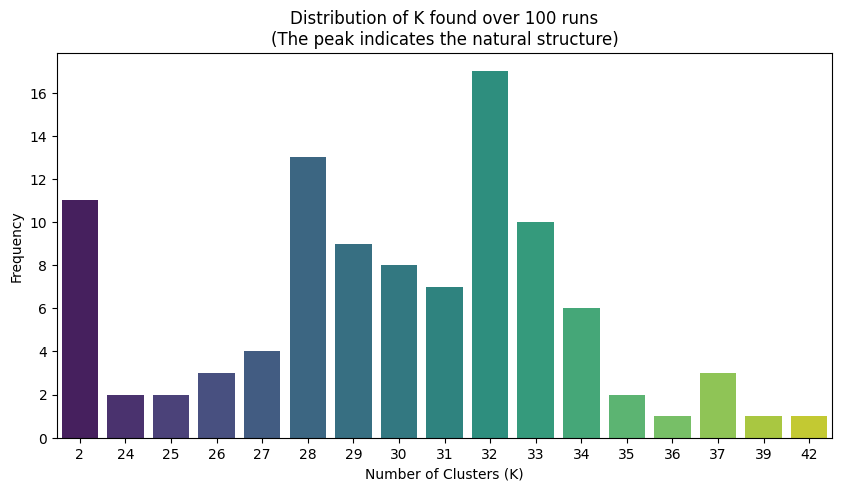

In [27]:
plt.figure(figsize=(10, 5))
sns.countplot(x='k', data=df_res, palette='viridis')
plt.title(f'Distribution of K found over {n_iterations} runs\n(The peak indicates the natural structure)')
plt.xlabel('Number of Clusters (K)')
plt.ylabel('Frequency')
plt.show()

In [ ]:
# plotting clusters for each combination of two features (only first 2 for visualization) inside one unique plot
mapping_features = df_num.columns.tolist()
plt.figure(figsize=(10, 6))
for i in range(X_scaled.shape[1]):
    for j in range(i + 1, X_scaled.shape[1]):
        plt.figure(figsize=(8, 6))
        sns.scatterplot(x=X_scaled[:, i], y=X_scaled[:, j], hue=final_labels, palette='Set1', s=100)
        #plt.scatter(centers_best[:, i], centers_best[:, j], c='black', s=100, marker='X', label='Centroids')
        plt.title(f'X-Means Clustering ({mapping_features[i]} vs {mapping_features[j]})')
        plt.xlabel(f'{mapping_features[i]}')
        plt.ylabel(f'{mapping_features[j]}')
        plt.legend()
        plt.show()

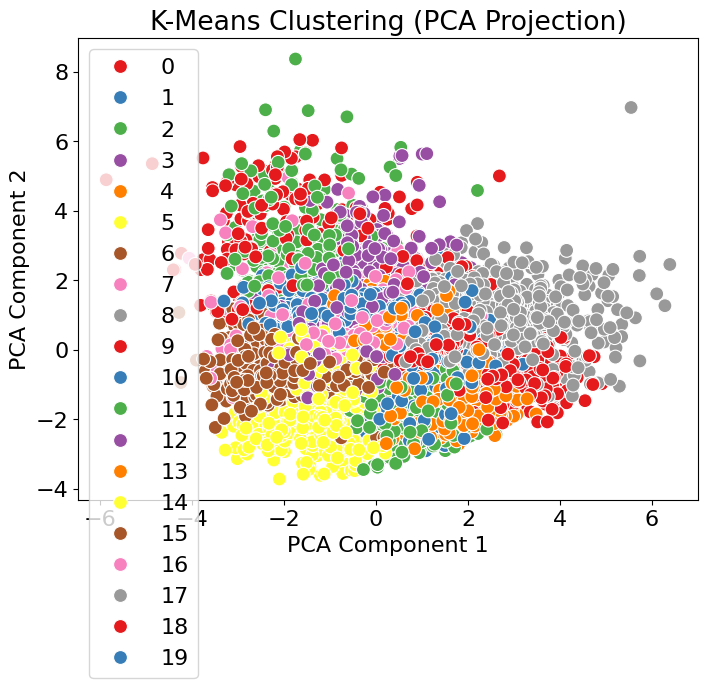

In [124]:
# PCA visualization x-means clusters
from sklearn.decomposition import PCA
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_scaled)
plt.figure(figsize=(8, 6))
sns.scatterplot(x=X_pca[:, 0], y=X_pca[:, 1], hue=labels, palette='Set1', s=100)
plt.title('K-Means Clustering (PCA Projection)')
plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')
plt.legend()
plt.show()

## Analyzing X-Means clusters 

(21879, 8)
Inverting log transformations for readability...

--- Cluster Summary (Mean Values) ---


Cluster_XMeans,0,1,2,3,4,5,6,7,8,9,...,22,23,24,25,26,27,28,29,30,31
YearPublished,2013.00,1986.00,1997.00,1999.00,2002.00,2012.00,-0.00,2011.00,2015.00,2008.00,...,2005.00,2001.00,2006.00,2011.00,2013.00,2006.00,2014.00,2015.00,2018.00,2013.00
GameWeight,2.67,2.50,3.22,2.05,3.36,3.98,1.67,1.33,2.17,1.83,...,1.69,1.39,1.58,1.33,1.25,2.12,1.33,1.69,2.76,1.33
MinPlayers,2.00,2.00,2.00,2.00,2.00,2.00,2.00,2.00,2.00,2.00,...,2.00,2.00,3.00,4.00,3.00,3.00,3.00,2.00,2.00,2.00
MaxPlayers,2.00,2.00,2.00,6.00,6.00,4.00,4.00,5.00,4.00,4.00,...,2.00,5.00,6.00,12.00,6.00,5.00,8.00,4.00,4.00,99.00
MfgPlaytime,45.00,120.00,240.00,60.00,180.00,1440.00,30.00,30.00,45.00,45.00,...,20.00,30.00,45.00,45.00,30.00,60.00,45.00,40.00,90.00,30.00
MfgAgeRec,10.00,12.00,12.00,10.00,12.00,12.00,8.00,8.00,10.00,8.00,...,9.00,8.00,10.00,12.00,8.00,11.00,16.00,13.00,13.00,10.00
EngagementLevel,3.92,3.71,4.24,4.53,4.47,4.74,3.63,5.88,6.28,8.12,...,4.00,3.64,6.44,4.03,3.95,4.28,4.09,4.01,4.88,4.22
Count,753.00,819.00,736.00,1169.00,583.00,160.00,252.00,1145.00,1079.00,530.00,...,994.00,1500.00,469.00,223.00,931.00,699.00,453.00,930.00,827.00,216.00
% Total,3.44,3.74,3.36,5.34,2.66,0.73,1.15,5.23,4.93,2.42,...,4.54,6.86,2.14,1.02,4.26,3.19,2.07,4.25,3.78,0.99


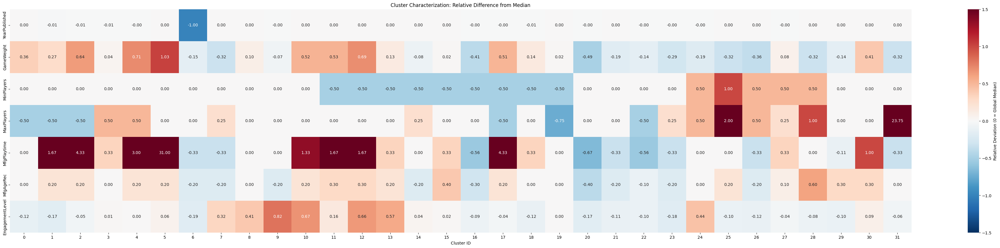

C:\Users\leona\AppData\Local\Temp\ipykernel_11656\1698762061.py:71: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Cluster_XMeans', y=col, data=df_analysis, ax=axes[i], palette='tab10')
C:\Users\leona\AppData\Local\Temp\ipykernel_11656\1698762061.py:71: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Cluster_XMeans', y=col, data=df_analysis, ax=axes[i], palette='tab10')
C:\Users\leona\AppData\Local\Temp\ipykernel_11656\1698762061.py:71: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Cluster_XMeans', y=col, data=df_analysis, ax=axes[i], 

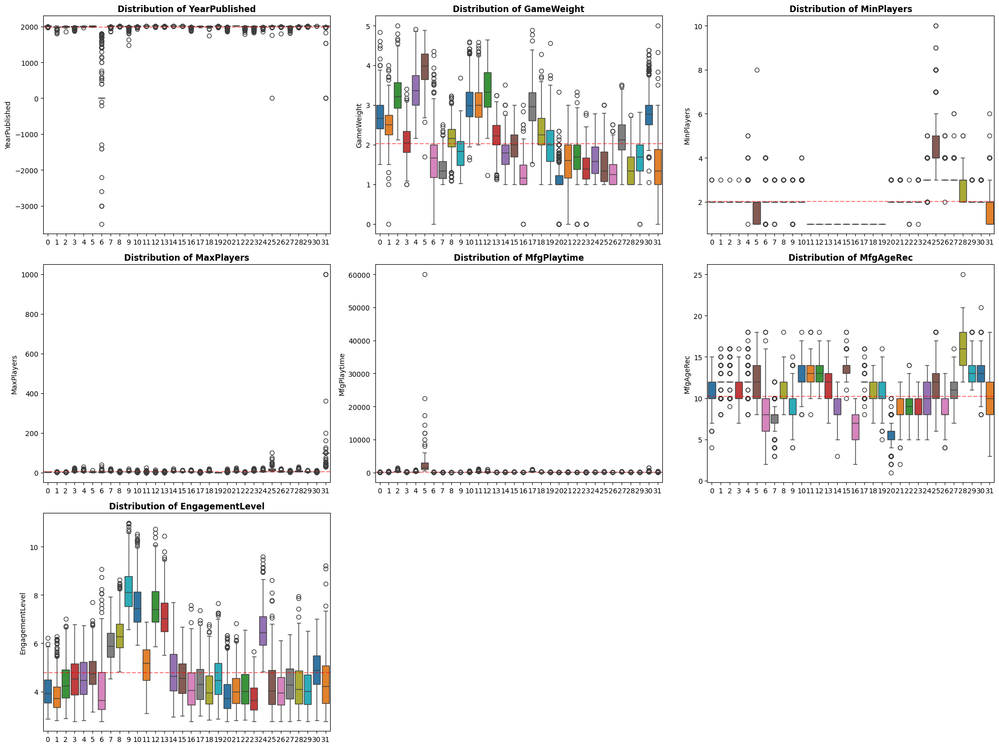


--- Analysis for Cluster 0 ---


,count,mean,std,min,25%,50%,75%,max
YearPublished,753.0,2011.58,6.37,1962.00,2009.00,2013.00,2016.00,2020.00
GameWeight,753.0,2.71,0.45,1.50,2.40,2.67,3.00,4.83
MinPlayers,753.0,2.00,0.06,2.00,2.00,2.00,2.00,3.00
MaxPlayers,753.0,2.89,1.13,2.00,2.00,2.00,4.00,6.00
MfgPlaytime,753.0,52.88,23.93,15.00,40.00,45.00,60.00,180.00
MfgAgeRec,753.0,10.63,1.55,4.00,10.00,10.00,12.00,15.00
EngagementLevel,753.0,4.03,0.64,2.86,3.54,3.92,4.49,6.21



--- Analysis for Cluster 1 ---


,count,mean,std,min,25%,50%,75%,max
YearPublished,819.0,1986.98,17.49,1802.0,1979.00,1986.00,1997.00,2015.00
GameWeight,819.0,2.49,0.40,0.0,2.25,2.50,2.75,4.00
MinPlayers,819.0,2.00,0.03,2.0,2.00,2.00,2.00,3.00
MaxPlayers,819.0,2.17,0.53,2.0,2.00,2.00,2.00,4.00
MfgPlaytime,819.0,118.68,56.55,30.0,90.00,120.00,120.00,360.00
MfgAgeRec,819.0,11.71,0.94,8.0,12.00,12.00,12.00,16.00
EngagementLevel,819.0,3.84,0.66,2.8,3.35,3.71,4.19,6.29



--- Analysis for Cluster 2 ---


,count,mean,std,min,25%,50%,75%,max
YearPublished,736.0,1996.32,13.69,1851.00,1986.00,1997.00,2007.00,2019.0
GameWeight,736.0,3.27,0.48,2.12,2.92,3.22,3.57,5.0
MinPlayers,736.0,2.00,0.04,2.00,2.00,2.00,2.00,3.0
MaxPlayers,736.0,2.09,0.36,2.00,2.00,2.00,2.00,4.0
MfgPlaytime,736.0,285.43,152.69,45.00,180.00,240.00,360.00,1500.0
MfgAgeRec,736.0,11.95,1.18,9.00,12.00,12.00,12.00,16.0
EngagementLevel,736.0,4.38,0.84,2.89,3.74,4.24,4.91,7.0



--- Analysis for Cluster 3 ---


,count,mean,std,min,25%,50%,75%,max
YearPublished,1169.0,1995.69,15.56,1864.00,1988.00,1999.00,2006.00,2017.00
GameWeight,1169.0,2.08,0.39,1.00,1.81,2.05,2.33,3.40
MinPlayers,1169.0,2.00,0.03,2.00,2.00,2.00,2.00,3.00
MaxPlayers,1169.0,5.83,2.16,3.00,4.00,6.00,6.00,24.00
MfgPlaytime,1169.0,81.14,40.57,15.00,60.00,60.00,90.00,360.00
MfgAgeRec,1169.0,10.41,1.49,7.00,10.00,10.00,12.00,16.00
EngagementLevel,1169.0,4.53,0.84,2.77,3.86,4.53,5.15,6.77



--- Analysis for Cluster 4 ---


,count,mean,std,min,25%,50%,75%,max
YearPublished,583.0,2000.06,11.75,1967.00,1993.00,2002.00,2010.00,2020.00
GameWeight,583.0,3.41,0.51,2.17,3.00,3.36,3.75,4.92
MinPlayers,583.0,2.18,0.44,1.00,2.00,2.00,2.00,5.00
MaxPlayers,583.0,6.01,2.41,3.00,4.00,6.00,6.00,30.00
MfgPlaytime,583.0,210.25,109.92,45.00,120.00,180.00,240.00,780.00
MfgAgeRec,583.0,12.13,1.42,8.00,12.00,12.00,12.00,18.00
EngagementLevel,583.0,4.56,0.87,2.80,3.89,4.47,5.22,6.75



--- Analysis for Cluster 5 ---


,count,mean,std,min,25%,50%,75%,max
YearPublished,160.0,2005.84,14.16,1973.00,1995.00,2012.00,2017.00,2021.00
GameWeight,160.0,3.93,0.51,1.69,3.64,3.98,4.29,4.89
MinPlayers,160.0,1.74,0.68,1.00,1.00,2.00,2.00,8.00
MaxPlayers,160.0,3.89,2.14,1.00,2.00,4.00,6.00,12.00
MfgPlaytime,160.0,2888.38,5454.79,480.00,960.00,1440.00,3000.00,60000.00
MfgAgeRec,160.0,12.13,1.91,8.00,10.00,12.00,14.00,18.00
EngagementLevel,160.0,4.86,0.82,3.16,4.30,4.74,5.27,7.70



--- Analysis for Cluster 6 ---


,count,mean,std,min,25%,50%,75%,max
YearPublished,252.0,203.50,793.73,-3500.00,-0.00,-0.00,-0.0,1803.00
GameWeight,252.0,1.75,0.71,0.00,1.18,1.67,2.0,4.35
MinPlayers,252.0,2.06,0.64,1.00,2.00,2.00,2.0,4.00
MaxPlayers,252.0,5.32,4.25,1.00,2.00,4.00,6.0,40.00
MfgPlaytime,252.0,38.06,30.33,1.00,20.00,30.00,45.0,180.00
MfgAgeRec,252.0,8.47,2.89,2.00,6.00,8.00,10.0,18.00
EngagementLevel,252.0,4.14,1.26,2.77,3.26,3.63,4.8,9.06



--- Analysis for Cluster 7 ---


,count,mean,std,min,25%,50%,75%,max
YearPublished,1145.0,2007.79,12.61,1850.00,2005.00,2011.00,2015.00,2021.00
GameWeight,1145.0,1.39,0.30,1.00,1.15,1.33,1.58,2.51
MinPlayers,1145.0,2.01,0.13,1.00,2.00,2.00,2.00,3.00
MaxPlayers,1145.0,5.23,1.89,2.00,4.00,5.00,6.00,20.00
MfgPlaytime,1145.0,27.07,12.32,2.00,20.00,30.00,30.00,90.00
MfgAgeRec,1145.0,7.83,1.35,3.00,7.00,8.00,8.00,12.00
EngagementLevel,1145.0,5.96,0.69,4.53,5.43,5.88,6.43,7.93



--- Analysis for Cluster 8 ---


,count,mean,std,min,25%,50%,75%,max
YearPublished,1079.0,2014.24,4.92,1992.00,2012.00,2015.00,2018.00,2021.00
GameWeight,1079.0,2.17,0.34,1.08,1.95,2.17,2.38,3.23
MinPlayers,1079.0,2.01,0.10,2.00,2.00,2.00,2.00,3.00
MaxPlayers,1079.0,3.93,1.27,2.00,4.00,4.00,5.00,9.00
MfgPlaytime,1079.0,50.56,18.97,5.00,40.00,45.00,60.00,150.00
MfgAgeRec,1079.0,11.06,1.74,8.00,10.00,10.00,12.00,18.00
EngagementLevel,1079.0,6.34,0.68,4.82,5.83,6.28,6.79,8.63



--- Analysis for Cluster 9 ---


,count,mean,std,min,25%,50%,75%,max
YearPublished,530.0,2000.52,36.40,1475.00,2000.00,2008.00,2014.00,2019.00
GameWeight,530.0,1.81,0.41,1.02,1.48,1.83,2.09,3.69
MinPlayers,530.0,2.01,0.26,1.00,2.00,2.00,2.00,3.00
MaxPlayers,530.0,4.78,1.88,2.00,4.00,4.00,6.00,20.00
MfgPlaytime,530.0,42.29,20.81,10.00,30.00,45.00,60.00,240.00
MfgAgeRec,530.0,9.08,1.69,4.00,8.00,8.00,10.00,15.00
EngagementLevel,530.0,8.22,0.92,6.58,7.53,8.12,8.77,10.98



--- Analysis for Cluster 10 ---


,count,mean,std,min,25%,50%,75%,max
YearPublished,795.0,2009.19,9.37,1925.00,2006.00,2011.00,2015.00,2021.00
GameWeight,795.0,3.04,0.48,1.61,2.70,2.99,3.33,4.59
MinPlayers,795.0,2.16,0.38,2.00,2.00,2.00,2.00,4.00
MaxPlayers,795.0,4.58,1.34,2.00,4.00,4.00,5.00,16.00
MfgPlaytime,795.0,118.38,60.03,20.00,90.00,105.00,120.00,480.00
MfgAgeRec,795.0,12.49,1.31,8.00,12.00,12.00,14.00,18.00
EngagementLevel,795.0,7.59,0.94,5.92,6.87,7.45,8.13,10.53



--- Analysis for Cluster 11 ---


,count,mean,std,min,25%,50%,75%,max
YearPublished,448.0,2018.50,2.31,2010.00,2017.00,2019.00,2020.00,2021.00
GameWeight,448.0,3.03,0.46,2.00,2.69,3.00,3.32,4.58
MinPlayers,448.0,1.00,0.00,1.00,1.00,1.00,1.00,1.00
MaxPlayers,448.0,4.44,1.71,1.00,4.00,4.00,5.00,24.00
MfgPlaytime,448.0,152.42,131.05,30.00,90.00,120.00,180.00,1200.00
MfgAgeRec,448.0,12.94,1.47,8.00,12.00,13.00,14.00,18.00
EngagementLevel,448.0,5.10,0.84,3.09,4.46,5.18,5.74,6.88



--- Analysis for Cluster 12 ---


,count,mean,std,min,25%,50%,75%,max
YearPublished,286.0,2015.87,5.75,1979.00,2015.00,2017.00,2019.00,2021.00
GameWeight,286.0,3.40,0.55,1.22,2.94,3.33,3.82,4.65
MinPlayers,286.0,1.00,0.00,1.00,1.00,1.00,1.00,1.00
MaxPlayers,286.0,4.44,1.26,1.00,4.00,4.00,5.00,16.00
MfgPlaytime,286.0,148.34,98.16,60.00,100.00,120.00,180.00,1000.00
MfgAgeRec,286.0,13.08,1.29,10.00,12.00,13.00,14.00,18.00
EngagementLevel,286.0,7.60,0.98,5.87,6.87,7.39,8.16,10.74



--- Analysis for Cluster 13 ---


,count,mean,std,min,25%,50%,75%,max
YearPublished,408.0,2015.64,5.04,1977.00,2014.00,2017.00,2019.00,2021.00
GameWeight,408.0,2.23,0.38,1.12,2.00,2.23,2.49,3.24
MinPlayers,408.0,1.00,0.00,1.00,1.00,1.00,1.00,1.00
MaxPlayers,408.0,4.51,1.28,1.00,4.00,4.00,5.00,10.00
MfgPlaytime,408.0,59.07,25.44,10.00,45.00,60.00,75.00,180.00
MfgAgeRec,408.0,11.66,1.89,7.00,10.00,12.00,13.00,17.00
EngagementLevel,408.0,7.15,0.86,5.51,6.49,7.03,7.67,10.44



--- Analysis for Cluster 14 ---


,count,mean,std,min,25%,50%,75%,max
YearPublished,479.0,2018.35,2.30,2010.00,2017.00,2019.00,2020.00,2021.00
GameWeight,479.0,1.78,0.44,1.00,1.50,1.80,2.00,3.50
MinPlayers,479.0,1.00,0.00,1.00,1.00,1.00,1.00,1.00
MaxPlayers,479.0,5.11,1.82,2.00,4.00,5.00,6.00,20.00
MfgPlaytime,479.0,45.98,27.70,5.00,30.00,45.00,60.00,300.00
MfgAgeRec,479.0,8.70,1.21,3.00,8.00,8.00,10.00,12.00
EngagementLevel,479.0,4.80,0.98,2.94,4.03,4.64,5.54,7.69



--- Analysis for Cluster 15 ---


,count,mean,std,min,25%,50%,75%,max
YearPublished,355.0,2018.23,2.55,2006.0,2017.00,2019.00,2020.00,2021.00
GameWeight,355.0,1.94,0.41,1.0,1.69,2.00,2.25,3.00
MinPlayers,355.0,1.00,0.00,1.0,1.00,1.00,1.00,1.00
MaxPlayers,355.0,4.84,1.55,2.0,4.00,4.00,6.00,12.00
MfgPlaytime,355.0,64.05,36.53,10.0,45.00,60.00,90.00,300.00
MfgAgeRec,355.0,13.46,1.12,10.0,13.00,14.00,14.00,18.00
EngagementLevel,355.0,4.58,0.79,3.0,3.92,4.55,5.16,6.67



--- Analysis for Cluster 16 ---


,count,mean,std,min,25%,50%,75%,max
YearPublished,419.0,2003.71,19.26,1870.00,2001.00,2010.00,2014.50,2020.00
GameWeight,419.0,1.27,0.34,0.00,1.00,1.17,1.49,3.00
MinPlayers,419.0,1.00,0.00,1.00,1.00,1.00,1.00,1.00
MaxPlayers,419.0,5.23,2.53,1.00,4.00,4.00,6.00,16.00
MfgPlaytime,419.0,19.69,10.57,1.00,10.00,20.00,20.00,60.00
MfgAgeRec,419.0,6.49,1.94,2.00,5.00,7.00,8.00,10.00
EngagementLevel,419.0,4.22,0.95,2.77,3.45,4.06,4.78,7.57



--- Analysis for Cluster 17 ---


,count,mean,std,min,25%,50%,75%,max
YearPublished,392.0,2000.22,13.38,1968.0,1991.00,2003.00,2012.00,2020.00
GameWeight,392.0,3.02,0.56,1.5,2.60,2.96,3.32,4.89
MinPlayers,392.0,1.00,0.00,1.0,1.00,1.00,1.00,1.00
MaxPlayers,392.0,2.43,1.33,1.0,2.00,2.00,2.00,8.00
MfgPlaytime,392.0,255.08,142.45,60.0,180.00,240.00,360.00,960.00
MfgAgeRec,392.0,11.77,1.20,8.0,12.00,12.00,12.00,16.00
EngagementLevel,392.0,4.40,0.88,3.0,3.67,4.31,4.93,7.37



--- Analysis for Cluster 18 ---


,count,mean,std,min,25%,50%,75%,max
YearPublished,362.0,1993.08,20.19,1742.00,1982.0,1995.00,2008.00,2017.00
GameWeight,362.0,2.32,0.54,1.00,2.0,2.25,2.67,4.27
MinPlayers,362.0,1.00,0.00,1.00,1.0,1.00,1.00,1.00
MaxPlayers,362.0,4.28,2.52,1.00,2.0,4.00,5.00,20.00
MfgPlaytime,362.0,67.53,41.32,10.00,45.0,60.00,90.00,300.00
MfgAgeRec,362.0,10.55,1.37,7.00,10.0,10.00,12.00,14.00
EngagementLevel,362.0,4.13,0.83,2.83,3.5,3.95,4.65,6.78



--- Analysis for Cluster 19 ---


,count,mean,std,min,25%,50%,75%,max
YearPublished,436.0,2014.38,5.96,1969.00,2011.75,2016.00,2018.00,2021.00
GameWeight,436.0,2.00,0.54,1.00,1.58,2.00,2.36,4.56
MinPlayers,436.0,1.00,0.00,1.00,1.00,1.00,1.00,1.00
MaxPlayers,436.0,1.37,0.50,1.00,1.00,1.00,2.00,3.00
MfgPlaytime,436.0,45.39,30.22,1.00,25.00,45.00,60.00,180.00
MfgAgeRec,436.0,10.65,1.79,5.00,10.00,10.00,12.00,16.00
EngagementLevel,436.0,4.60,0.94,2.86,3.88,4.48,5.19,7.65



--- Analysis for Cluster 20 ---


,count,mean,std,min,25%,50%,75%,max
YearPublished,1374.0,2005.62,14.02,1851.00,2003.0,2009.00,2014.00,2020.00
GameWeight,1374.0,1.14,0.26,0.00,1.0,1.00,1.22,3.32
MinPlayers,1374.0,2.01,0.12,2.00,2.0,2.00,2.00,3.00
MaxPlayers,1374.0,4.69,1.59,2.00,4.0,4.00,5.00,20.00
MfgPlaytime,1374.0,18.00,8.85,1.00,10.0,15.00,20.00,60.00
MfgAgeRec,1374.0,5.60,1.39,1.00,5.0,6.00,6.00,10.00
EngagementLevel,1374.0,3.84,0.68,2.77,3.3,3.73,4.30,6.32



--- Analysis for Cluster 21 ---


,count,mean,std,min,25%,50%,75%,max
YearPublished,1657.0,2017.80,2.11,2012.0,2016.00,2018.00,2019.00,2021.00
GameWeight,1657.0,1.56,0.42,0.0,1.17,1.60,2.00,3.00
MinPlayers,1657.0,2.02,0.13,2.0,2.00,2.00,2.00,3.00
MaxPlayers,1657.0,4.87,1.67,2.0,4.00,4.00,6.00,24.00
MfgPlaytime,1657.0,36.17,18.94,5.0,20.00,30.00,45.00,200.00
MfgAgeRec,1657.0,8.35,1.26,2.0,8.00,8.00,10.00,12.00
EngagementLevel,1657.0,4.04,0.67,2.8,3.51,3.99,4.54,6.81



--- Analysis for Cluster 22 ---


,count,mean,std,min,25%,50%,75%,max
YearPublished,994.0,2000.05,18.66,1783.00,1995.00,2005.00,2011.00,2019.00
GameWeight,994.0,1.70,0.44,0.00,1.38,1.69,2.00,3.33
MinPlayers,994.0,2.00,0.06,1.00,2.00,2.00,2.00,3.00
MaxPlayers,994.0,2.18,0.54,1.00,2.00,2.00,2.00,5.00
MfgPlaytime,994.0,23.57,12.57,1.00,15.00,20.00,30.00,90.00
MfgAgeRec,994.0,9.02,1.52,5.00,8.00,9.00,10.00,14.00
EngagementLevel,994.0,4.15,0.81,2.83,3.48,4.00,4.73,6.55



--- Analysis for Cluster 23 ---


,count,mean,std,min,25%,50%,75%,max
YearPublished,1500.0,1995.12,18.99,1819.00,1988.00,2001.00,2007.00,2015.00
GameWeight,1500.0,1.41,0.34,0.00,1.13,1.39,1.67,2.80
MinPlayers,1500.0,2.01,0.11,1.00,2.00,2.00,2.00,3.00
MaxPlayers,1500.0,5.65,2.21,2.00,4.00,5.00,6.00,22.00
MfgPlaytime,1500.0,39.48,19.62,5.00,30.00,30.00,45.00,180.00
MfgAgeRec,1500.0,8.69,1.32,5.00,8.00,8.00,10.00,12.00
EngagementLevel,1500.0,3.73,0.60,2.77,3.24,3.64,4.15,5.66



--- Analysis for Cluster 24 ---


,count,mean,std,min,25%,50%,75%,max
YearPublished,469.0,2004.72,13.64,1850.00,2000.00,2006.00,2013.00,2021.00
GameWeight,469.0,1.64,0.42,1.00,1.28,1.58,1.94,2.79
MinPlayers,469.0,3.12,0.44,2.00,3.00,3.00,3.00,5.00
MaxPlayers,469.0,7.04,3.02,4.00,5.00,6.00,8.00,24.00
MfgPlaytime,469.0,43.98,24.06,5.00,30.00,45.00,60.00,240.00
MfgAgeRec,469.0,10.14,1.76,5.00,8.00,10.00,12.00,14.00
EngagementLevel,469.0,6.56,0.86,4.82,5.92,6.44,7.11,9.60



--- Analysis for Cluster 25 ---


,count,mean,std,min,25%,50%,75%,max
YearPublished,223.0,1999.24,135.87,-0.00,2005.00,2011.00,2017.00,2021.0
GameWeight,223.0,1.49,0.48,1.00,1.07,1.33,1.82,3.0
MinPlayers,223.0,4.91,1.44,3.00,4.00,4.00,5.00,10.0
MaxPlayers,223.0,16.53,12.08,6.00,10.00,12.00,20.00,100.0
MfgPlaytime,223.0,55.11,49.56,10.00,30.00,45.00,60.00,360.0
MfgAgeRec,223.0,11.70,2.55,6.00,10.00,12.00,13.00,18.0
EngagementLevel,223.0,4.29,1.09,2.77,3.47,4.03,4.88,8.6



--- Analysis for Cluster 26 ---


,count,mean,std,min,25%,50%,75%,max
YearPublished,931.0,2010.56,10.26,1800.00,2006.00,2013.00,2017.0,2021.00
GameWeight,931.0,1.32,0.32,1.00,1.00,1.25,1.5,2.50
MinPlayers,931.0,3.14,0.37,2.00,3.00,3.00,3.0,5.00
MaxPlayers,931.0,6.64,1.99,3.00,5.00,6.00,8.0,21.00
MfgPlaytime,931.0,30.22,13.87,1.00,20.00,30.00,40.0,90.00
MfgAgeRec,931.0,8.72,1.55,4.00,8.00,8.00,10.0,13.00
EngagementLevel,931.0,4.04,0.74,2.77,3.44,3.95,4.6,6.11



--- Analysis for Cluster 27 ---


,count,mean,std,min,25%,50%,75%,max
YearPublished,699.0,2002.34,18.01,1810.00,1997.00,2006.00,2013.00,2019.00
GameWeight,699.0,2.19,0.46,1.00,1.88,2.12,2.50,3.50
MinPlayers,699.0,3.13,0.36,3.00,3.00,3.00,3.00,6.00
MaxPlayers,699.0,5.47,1.20,3.00,5.00,5.00,6.00,13.00
MfgPlaytime,699.0,72.17,38.32,10.00,45.00,60.00,90.00,360.00
MfgAgeRec,699.0,11.06,1.48,7.00,10.00,11.00,12.00,16.00
EngagementLevel,699.0,4.33,0.81,2.77,3.71,4.28,4.95,6.37



--- Analysis for Cluster 28 ---


,count,mean,std,min,25%,50%,75%,max
YearPublished,453.0,2011.16,8.51,1962.0,2008.00,2014.00,2017.00,2021.00
GameWeight,453.0,1.39,0.40,1.0,1.00,1.33,1.69,2.75
MinPlayers,453.0,2.81,0.69,2.0,2.00,3.00,3.00,5.00
MaxPlayers,453.0,8.81,4.22,4.0,6.00,8.00,10.00,30.00
MfgPlaytime,453.0,48.60,27.70,1.0,30.00,45.00,60.00,240.00
MfgAgeRec,453.0,15.65,2.18,12.0,14.00,16.00,18.00,25.00
EngagementLevel,453.0,4.24,0.94,2.8,3.48,4.09,4.86,7.94



--- Analysis for Cluster 29 ---


,count,mean,std,min,25%,50%,75%,max
YearPublished,930.0,2014.24,4.86,1981.00,2012.00,2015.00,2018.00,2021.00
GameWeight,930.0,1.66,0.40,0.00,1.33,1.69,2.00,2.82
MinPlayers,930.0,2.02,0.14,2.00,2.00,2.00,2.00,3.00
MaxPlayers,930.0,4.72,1.61,2.00,4.00,4.00,6.00,12.00
MfgPlaytime,930.0,40.70,20.01,2.00,30.00,40.00,50.00,180.00
MfgAgeRec,930.0,13.18,1.15,11.00,12.00,13.00,14.00,18.00
EngagementLevel,930.0,4.12,0.77,2.77,3.47,4.01,4.71,6.52



--- Analysis for Cluster 30 ---


,count,mean,std,min,25%,50%,75%,max
YearPublished,827.0,2017.74,2.44,2008.00,2016.0,2018.00,2020.00,2021.00
GameWeight,827.0,2.80,0.47,1.05,2.5,2.76,3.00,4.38
MinPlayers,827.0,2.08,0.28,2.00,2.0,2.00,2.00,3.00
MaxPlayers,827.0,4.39,1.41,2.00,4.0,4.00,5.00,12.00
MfgPlaytime,827.0,111.15,90.78,20.00,60.0,90.00,120.00,1440.00
MfgAgeRec,827.0,12.96,1.48,8.00,12.0,13.00,14.00,21.00
EngagementLevel,827.0,4.90,0.82,2.80,4.3,4.88,5.49,7.01



--- Analysis for Cluster 31 ---


,count,mean,std,min,25%,50%,75%,max
YearPublished,216.0,1975.76,240.07,-0.00,2004.75,2013.00,2017.00,2021.00
GameWeight,216.0,1.56,0.68,0.00,1.00,1.33,1.89,5.00
MinPlayers,216.0,2.08,0.95,1.00,1.00,2.00,2.00,6.00
MaxPlayers,216.0,104.05,110.67,30.00,99.00,99.00,99.00,999.00
MfgPlaytime,216.0,49.44,58.87,1.00,20.00,30.00,45.00,360.00
MfgAgeRec,216.0,10.46,3.45,3.00,8.00,10.00,12.00,18.00
EngagementLevel,216.0,4.45,1.19,2.77,3.51,4.22,5.07,9.21


In [30]:
# --- 1. Preparazione dei Dati per l'Analisi ---
# Copiamo il dataset filtrato per non sporcare l'originale
df_analysis = df_num.copy()
print(df_analysis.shape)
# Aggiungiamo le etichette dei cluster trovati
# Assicurati che 'kmeans' sia il tuo modello fittato e 'X_final' i dati usati

# --- IMPORTANTE: Inversione delle trasformazioni ---
# Per interpretare i dati, dobbiamo tornare ai valori originali (non logaritmici)
# Se hai la lista 'log_cols' dal tuo codice precedente:
if 'log_cols' in locals():
    print("Inverting log transformations for readability...")
    for col in log_cols:
        if col in df_analysis.columns:
            # Applichiamo expm1 (inverso di log1p)
            df_analysis[col] = np.expm1(df_analysis[col])

# ritraformazione di YearPublished in 'Anno' invece di 'Recency'
if 'YearPublished' in df_analysis.columns:
    df_analysis['YearPublished'] = df['YearPublished'].max() - df_analysis['YearPublished']

# --- 2. Tabella Riassuntiva (Centroidi Reali) ---
# Calcoliamo la mediana di ogni feature per ogni cluster
cluster_medians = df_analysis.groupby('Cluster_XMeans').median()
cluster_counts = df_analysis['Cluster_XMeans'].value_counts().sort_index()

# Aggiungiamo la dimensione del cluster per contesto
cluster_summary = cluster_medians.copy()
cluster_summary['Count'] = cluster_counts
cluster_summary['% Total'] = (cluster_counts / len(df_analysis)) * 100

print("\n--- Cluster Summary (Mean Values) ---")
# Trasponiamo per leggere meglio se hai tante colonne
display(cluster_summary.T.round(2))


# --- 3. Heatmap delle Differenze Relative (Profilazione) ---
# Questa visualizzazione risponde a: "In cosa questo cluster è diverso dalla mediana globale?"
# Rosso = Molto sopra la mediana, Blu = Molto sotto la mediana

global_median = df_analysis.drop(columns=['Cluster_XMeans']).median()
# Calcoliamo la deviazione percentuale dalla mediana globale
relative_imp = (cluster_medians - global_median) / global_median

plt.figure(figsize=(50, 10))
sns.heatmap(data=relative_imp.T, 
            cmap='RdBu_r', 
            center=0, 
            annot=True, 
            fmt=".2f",
            vmax=1.5, vmin=-1.5, # Limita i colori estremi per leggibilità
            cbar_kws={'label': 'Relative Deviation (0 = Global Median)'})
plt.title('Cluster Characterization: Relative Difference from Median')
plt.xlabel('Cluster ID')
plt.show()


# --- 4. Boxplots Dettagliati (Distribuzione) ---
# I boxplot sono fondamentali per vedere se un cluster è "compatto" o "disperso"
# Creiamo un grafico per ogni feature numerica

features_to_plot = [col for col in df_analysis.columns if col not in ['Cluster_XMeans']]
n_features = len(features_to_plot)
n_cols = 3
n_rows = (n_features + n_cols - 1) // n_cols

fig, axes = plt.subplots(n_rows, n_cols, figsize=(20, 5 * n_rows))
axes = axes.flatten()

for i, col in enumerate(features_to_plot):
    sns.boxplot(x='Cluster_XMeans', y=col, data=df_analysis, ax=axes[i], palette='tab10')
    axes[i].set_title(f'Distribution of {col}', fontsize=12, fontweight='bold')
    axes[i].set_xlabel('')
    
    # Linea tratteggiata rossa per la media globale
    global_avg = df_analysis[col].mean()
    axes[i].axhline(global_avg, color='red', linestyle='--', alpha=0.5, label='Global Avg')

# Rimuovi assi vuoti se ce ne sono
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

# --- 5. Analisi divisa per Cluster ---
for cluster_id in sorted(df_analysis['Cluster_XMeans'].unique()):
    print(f"\n--- Analysis for Cluster {cluster_id} ---")
    cluster_data = df_analysis[df_analysis['Cluster_XMeans'] == cluster_id]
    # display statistics without the Cluster column
    display(cluster_data.drop(columns=['Cluster_XMeans']).describe().T.round(2))

## Observing clusters-categories relations

Cluster 0:
 Number of items: 1455
  HasFamily distribution:
HasFamily
0    76.769759
1    23.230241
Name: proportion, dtype: float64
  Category distribution:
Category
NoCategory    57.938144
Childrens     33.127148
Abstract       3.917526
Family         3.573883
Party          1.237113
Thematic       0.137457
CGS            0.068729
Name: proportion, dtype: float64
  Rating distribution:
Rating
Low       71.683849
Medium    27.147766
High       1.168385
Name: proportion, dtype: float64
  Kickstarted distribution:
Kickstarted
0    96.151203
1     3.848797
Name: proportion, dtype: float64
  IsReimplementation distribution:
IsReimplementation
0    92.09622
1     7.90378
Name: proportion, dtype: float64
  Median Rank: 21926.0
  Median NumImplementations: 0.0
  Median NumExpansions: 0.0
  Median NumAlternates: 0.6931471805599453


Cluster 1:
 Number of items: 252
  HasFamily distribution:
HasFamily
0    76.587302
1    23.412698
Name: proportion, dtype: float64
  Category distribution:
Categ

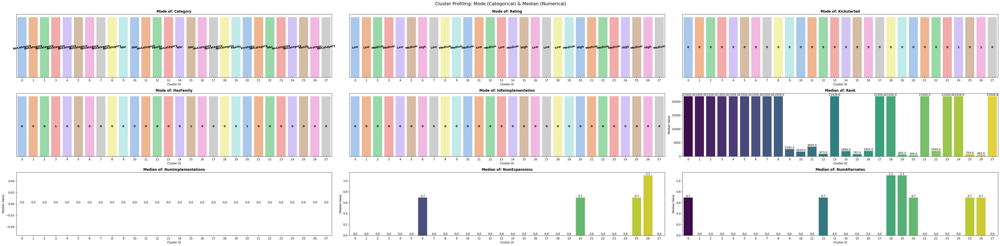


--- Summary Table ---


,Category,Rating,Kickstarted,HasFamily,IsReimplementation,Rank,NumImplementations,NumExpansions,NumAlternates
Cluster_XMeans,,,,,,,,,
0,NoCategory,Low,0,0,0,21926.0,0.0,0.000000,0.693147
1,NoCategory,Low,0,0,0,21926.0,0.0,0.000000,0.000000
2,NoCategory,Medium,0,0,0,21926.0,0.0,0.000000,0.000000
3,NoCategory,Medium,0,1,0,21926.0,0.0,0.000000,0.000000
4,NoCategory,Low,0,0,0,21926.0,0.0,0.000000,0.000000
5,NoCategory,Medium,0,0,0,21926.0,0.0,0.000000,0.000000
6,NoCategory,High,0,0,0,21926.0,0.0,0.693147,0.000000
7,NoCategory,Low,0,0,0,21926.0,0.0,0.000000,0.000000
8,NoCategory,Medium,0,0,0,21926.0,0.0,0.000000,0.000000


In [36]:
 # check if clusters match some categorical features

# --- IGNORE ---

for i in range(len(set(labels))):

    cluster = np.where(labels == i)[0]

    cluster_indices = cluster

    cluster_data = df.iloc[cluster_indices]

    print(f"Cluster {i}:")

    print(f" Number of items: {len(cluster_data)}")

    for col in ['HasFamily', 'Category', 'Rating', 'Kickstarted', 'IsReimplementation','Rank','NumImplementations','NumExpansions','NumAlternates']:

        if col == 'Rank':

            median_rank = cluster_data[col].median()

            print(f"  Median {col}: {median_rank}")

            continue

        if col == 'NumImplementations':

            median_imp= cluster_data[col].median()

            print(f"  Median {col}: {median_imp}")

            continue

        if col == 'NumExpansions':

            median_exp = cluster_data[col].median()

            print(f"  Median {col}: {median_exp}")

            continue

        if col == 'NumAlternates':

            median_alt = cluster_data[col].median()

            print(f"  Median {col}: {median_alt}")

            continue

       

        value_counts = cluster_data[col].value_counts(normalize=True) * 100

        print(f"  {col} distribution:")

        print(value_counts)

    print("\n")

# --- CONFIGURAZIONE ---
# Usa le labels del tuo modello X-Means finale
# Assicurati che 'labels' contenga l'array di etichette del modello scelto
unique_labels = sorted(list(set(labels)))

# Definiamo quali feature trattare come CATEGORICHE (Moda) e quali NUMERICHE (Mediana)
cat_features = ['Category', 'Rating', 'Kickstarted', 'HasFamily', 'IsReimplementation']
num_features = ['Rank', 'NumImplementations', 'NumExpansions', 'NumAlternates']

features_of_interest = cat_features + num_features

results = []

for i in unique_labels:
    # IMPORTANTE: Usiamo 'df' originale, non 'df_num' o 'X_scaled'
    cluster_indices = np.where(labels == i)[0]
    cluster_data = df.iloc[cluster_indices]
    
    # Dizionario per salvare i dati di questo cluster
    cluster_stats = {'Cluster_XMeans': i}
    
    # 1. Calcolo MODE per Categoriche
    for col in cat_features:
        if col in cluster_data.columns:
            try:
                cluster_stats[col] = cluster_data[col].mode().iloc[0]
            except IndexError:
                cluster_stats[col] = "N/A"
    
    # 2. Calcolo MEDIANE per Numeriche
    for col in num_features:
        if col in cluster_data.columns:
            cluster_stats[col] = cluster_data[col].median()
            
    results.append(cluster_stats)

# Creiamo il DataFrame riassuntivo
df_profiling = pd.DataFrame(results).set_index('Cluster_XMeans')

# --- PLOTTING ---
n_cols = 3
n_rows = (len(features_of_interest) + n_cols - 1) // n_cols

fig, axes = plt.subplots(n_rows, n_cols, figsize=(50, 4 * n_rows))
axes = axes.flatten()

for i, col in enumerate(features_of_interest):
    ax = axes[i]
    
    if col not in df_profiling.columns:
        continue

    # A. Variabili NUMERICHE -> Barplot classico (Altezza = Valore)
    if col in num_features:
        sns.barplot(x=df_profiling.index, y=df_profiling[col], ax=ax, palette='viridis', hue=df_profiling.index, legend=False)
        ax.set_title(f'Median of: {col}', fontweight='bold')
        ax.set_ylabel('Median Value')
        
        # Etichette sui valori
        for container in ax.containers:
            ax.bar_label(container, fmt='%.1f') 

    # B. Variabili CATEGORICHE -> Barplot "Testuale"
    else:
        # Creiamo barre tutte alte uguali
        sns.barplot(x=df_profiling.index, y=[1]*len(df_profiling), ax=ax, palette='pastel', hue=df_profiling.index, legend=False)
        
        ax.set_title(f'Mode of: {col}', fontweight='bold')
        ax.set_yticks([]) 
        ax.set_ylabel('')
        
        # Scriviamo il testo dentro le barre
        for j, label_text in enumerate(df_profiling[col]):
            # Accorciamo stringhe troppo lunghe per evitare sovrapposizioni
            text_str = str(label_text)
            if len(text_str) > 15:
                text_str = text_str[:12] + "..."
            
            ax.text(j, 0.5, text_str, 
                    ha='center', va='center', 
                    rotation=10, fontsize=10, fontweight='bold', color='black')

    ax.set_xlabel('Cluster ID')

# Rimuovi assi vuoti
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.suptitle("Cluster Profiling: Mode (Categorical) & Median (Numerical)", y=1.02, fontsize=16)
plt.show()

print("\n--- Summary Table ---")
display(df_profiling)

## 4. K-Modes

In [131]:
from kmodes.kmodes import KModes

In [132]:
# extracting categorical columns
df = pd.read_csv("./dataset/DM1_game_dataset_cleaned.csv")

df_cat = df[["HasFamily","Category","Rating"]]


km = KModes(n_clusters=4, init='Huang', n_init=5, verbose=0, random_state=42)
clusters = km.fit_predict(df_cat)

In [133]:
km.cluster_centroids_ # the modes of the clusters

array([['0', 'NoCategory', 'Low'],
       ['0', 'Strategy', 'High'],
       ['1', 'War', 'Medium'],
       ['0', 'NoCategory', 'Medium']], dtype='<U11')

In [134]:
km.labels_

array([0, 3, 0, ..., 0, 1, 0], dtype=uint16)

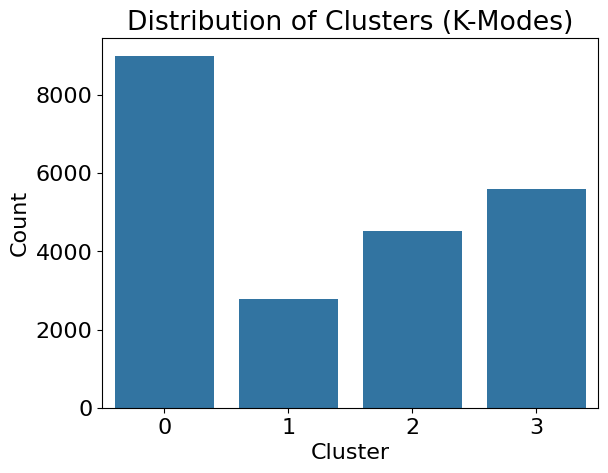

In [135]:
# show the distribution of clusters
sns.countplot(x=clusters)
plt.title('Distribution of Clusters (K-Modes)')
plt.xlabel('Cluster')
plt.ylabel('Count')
plt.show()


## 5. K-Medoid
The centroids are actual points and not the mean of the points

In [54]:
from pyclustering.cluster import kmedoids

In [ ]:
# Set random initial medoids.
initial_medoids = [1, 10]

kmedoids_instance = kmedoids.kmedoids(X_scaled, initial_medoids)
kmedoids_instance.process()

In [ ]:
clusters = kmedoids_instance.get_clusters()
clusters = [np.array(x) for x in clusters]

In [ ]:
clusters